In [4]:
#Import packages
import math
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib_venn import venn2
from matplotlib_venn import venn3
from matplotlib.font_manager import FontProperties
import scipy
from scipy import stats
from scipy.stats import linregress
import scipy.cluster.hierarchy as sch
import statsmodels.formula.api as smf
from bioinfokit.analys import stat
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px

In [5]:
#Set figure resolution to 300dpi
import matplotlib as mpl
%matplotlib inline
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [6]:
#Optional for disabling warnings 
import sys
if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")

In [7]:
def plot_corr(df,size=10):
    '''Plot a graphical correlation matrix for a dataframe.

    Input:
        df: pandas DataFrame
        size: vertical and horizontal size of the plot'''
    
    %matplotlib inline
    import matplotlib.pyplot as plt

    # Compute the correlation matrix for the received dataframe
    corr = df.corr()
    
    # Plot the correlation matrix
    fig, ax = plt.subplots(figsize=(size, size))
    cax = ax.matshow(corr, cmap='RdYlGn')
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90);
    plt.yticks(range(len(corr.columns)), corr.columns);
    
    # Add the colorbar legend
    cbar = fig.colorbar(cax, ticks=[-1, 0, 1], aspect=40, shrink=.8)

In [8]:
def cluster_corr(corr_array, inplace=False):
    """
    Rearranges the correlation matrix, corr_array, so that groups of highly 
    correlated variables are next to eachother 
    
    Parameters
    ----------
    corr_array : pandas.DataFrame or numpy.ndarray
        a NxN correlation matrix 
        
    Returns
    -------
    pandas.DataFrame or numpy.ndarray
        a NxN correlation matrix with the columns and rows rearranged
    """
    pairwise_distances = sch.distance.pdist(corr_array)
    linkage = sch.linkage(pairwise_distances, method='complete')
    cluster_distance_threshold = pairwise_distances.max()/2
    idx_to_cluster_array = sch.fcluster(linkage, cluster_distance_threshold, 
                                        criterion='distance')
    idx = np.argsort(idx_to_cluster_array)
    
    if not inplace:
        corr_array = corr_array.copy()
    
    if isinstance(corr_array, pd.DataFrame):
        return corr_array.iloc[idx, :].T.iloc[idx, :]
    return corr_array[idx, :][:, idx]

In [9]:
ttests=[]
def ttest(df, df_sub1, df_sub2):
    """
    This function takes two subsetted dataframes where
    protein ID's are along the index and the samples
    you are testing are in the columns, and performs a
    ttest to determine whether each protein in the 
    subsets are at different levels. This function
    returns the original dataframe with a new column 
    for the p-value associated with the t-test. 
    equal_var can be set to True or false depending 
    on whether you need to perform welches correction 
    on the data.
    
    parameters
    ----------
    df: pd.DataFrame
    df_sub1: pd.DataFrame
    df_sub2: pd.DataFrame
    
    returns
    -------
    dataframe with p-values
    
    """
    from scipy.stats import ttest_ind
    df_sub1 = df_sub1.transpose() # Transposition is  required
    df_sub2 = df_sub2.transpose()
    ttests = ttest_ind(df_sub1,df_sub2,equal_var=False,
                       nan_policy='omit')
    ttests = ttests.pvalue.transpose() # Transpose the pvalues back to the original orientation.
    df['ttest_pvalue']=ttests
    return df

In [10]:
def volcano(df, significantdf, foldchange, pvalue, savename):
    plt.figure(figsize=(10, 10))
    plt.scatter(df['%s' % (foldchange)], df['%s' % (pvalue)], c='#a6bddb',s=50, label='Does not meet thresholds')
    plt.scatter(significantdf['%s' % (foldchange)], significantdf['%s' % (pvalue)], c='#ffeda0', s=50, label='Significant')
    plt.ylabel('-Log(P-value)', fontsize=18)
    plt.xlabel('Fold Change', fontsize=18)
    plt.legend(scatterpoints=1)
    plt.savefig('%s' % (savename))

In [11]:
def volcanotop10(df, significantdf,top10high,top10low,foldchange, pvalue, savename):
    plt.figure(figsize=(10, 10))
    plt.scatter(df['%s' % (foldchange)], df['%s' % (pvalue)], c='#a6bddb',s=20, label='Does not meet thresholds')
    plt.scatter(significantdf['%s' % (foldchange)], significantdf['%s' % (pvalue)], c='#ffeda0', s=50, label='Significant')
    plt.scatter(top10high['%s' % (foldchange)], top10high['%s' % (pvalue)], c='r', s=50, label='Top 10 Grp2')
    plt.scatter(top10low['%s' % (foldchange)], top10low['%s' % (pvalue)], c='b', s=50, label='Top 10 Grp1')
    plt.ylabel('-Log(P-value)', fontsize=18)
    plt.xlabel('Fold Change', fontsize=18)
    plt.legend(scatterpoints=1)
    plt.savefig('%s' % (savename))

In [12]:
def fold(df, sub1, sub2, sub1name, sub2name):
    """
    Creates a new column in your dataframe (df) for fold change between
    two sample types (in separate dataframes sub1 and sub2).
    
    Parameters
    ----------
    df : pd.DataFrame
    sub1 : pd.DataFrame
    sub2 : pd.DataFrame
    sub1name : string
    sub2name : string
    
    Returns
    -------
    Newly formed column in your dataframe.
    """
    df['%s Mean' % (sub1name)]=sub1.mean(axis=1,skipna=True)
    df['%s Mean' % (sub2name)]=sub2.mean(axis=1,skipna=True)
    df['Fold Change(%s/%s)' % (sub1name, sub2name)]=df['%s Mean' % (sub1name)]/df['%s Mean' % (sub2name)]
    return df['Fold Change(%s/%s)' % (sub1name, sub2name)]

In [13]:
def piscore(df,sub1name,sub2name):
    """
    pi score is a function which combines outputs from ttest and fold change functions
    and multiplies them to help pick biologically relevant hits within your systems.
    
    Parameters
    ----------
    df : pd.DataFrame
    sub1name : string
    sub2name: string
    
    Returns
    -------
    Newly formed column in your dataframe
    
    
    """
    df['Log2(Fold Change)'] = np.log2(df['Fold Change(%s/%s)'% (sub1name,sub2name)])
    df['-Log(P-value)'] = -np.log10(df['ttest_pvalue'])
    df['%s/%s pi score' % (sub1name,sub2name)] = df['-Log(P-value)']*df['Log2(Fold Change)']
    return df['%s/%s pi score' % (sub1name,sub2name)]

In [14]:
def TwoCategoryMaster(dfmain,dfsub1,dfsub2,sub1name,sub2name):
    """
    This function combines previously created user-defined functions to streamline the data
    analysis.
    
    Parameters
    ----------
    dfmain : pd.DataFrame
    dfsub1 : pd.DataFrame
    dfsub2 : pd.DataFrame
    sub1name : string
    sub2name : string
    
    Returns
    -------
    Updated dataframe
    """
    ttest(dfmain,dfsub1,dfsub2)
    fold(dfmain,dfsub1,dfsub2,sub1name,sub2name)
    piscore(dfmain,sub1name,sub2name)
    return dfmain

In [15]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 30)

In [16]:
# load data file
df = pd.read_excel (r'./mx_608351_annotated.xlsx', index_col=0)
df

,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7
metabolite,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
xylulose,1290,2112,1046,926,1106,890,1088,1050,1259,1403,1166,788,1138,1612,651,894,1398,569,1283,791,1343,1166,1388,1344,975,1236,1120,1235,1241,1584,1333,1613,1429,1266,1333,767,1292,862,1519,1029,1603,1594,1059,1629,933,1328,1077,1735,1546,1649,1735,1103,1243,1593,1242,1189,1247,1200,1245,1696,1227,1606,855,814,1597,1873,1634,935,1211,758,1339,1234,1274,2189,994,827,1569,867,1139,1279,1172,1265,1594,1155,846,1441,1508,932
xylose,3233,3726,2823,4138,4853,3804,3525,5340,2203,6668,6648,3677,4254,5547,1964,3734,3351,7070,3607,4081,3537,4614,74549,56804,3843,3688,2787,4690,2711,4243,8212,3971,13290,4417,14185,2965,4139,4672,2441,2224,4044,3822,5143,4648,3116,3817,3924,2858,3150,6454,5482,2592,4503,3519,25669,8728,4826,2810,2505,3187,15581,4073,9238,4438,68284,4205,3122,3019,5064,3234,7020,3127,5386,19342,2417,3237,3927,2168,6658,3036,8104,6342,8282,6168,6979,6307,8299,7817
xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109
valine,276131,288187,445771,747718,421332,388093,687899,219039,231204,482086,502335,373219,516675,260544,601783,717152,582775,617201,687413,281399,570384,482853,251066,467891,281536,549454,464481,519592,433613,517068,515781,466590,433615,679086,390731,750879,320589,568872,539901,253772,443244,352146,496728,636087,631247,407010,617442,430014,301897,294743,375008,457489,505554,521507,382317,670555,301978,552285,543101,254292,475512,292035,205897,608802,366284,541470,307233,624033,134242,551916,520175,426369,217877,371425,546934,563298,418838,573109,426019,230610,354517,529537,337474,543227,541503,534820,304721,524319
uric acid,114534,160807,55772,93506,61041,91720,67616,85281,43811,41397,113637,109697,40950,73902,57891,79101,123241,87044,59621,84710,149080,108049,103065,54081,77094,61132,72424,61649,65041,117765,98307,114793,110162,60139,41167,44967,71313,121430,49769,34736,98775,97389,75811,88457,96628,106125,117744,115433,46339,76542,175980,111604,71518,73929,79051,80795,149845,86200,132827,102806,119280,146239,86742,43448,79353,80526,73330,107980,111104,75065,89598,88540,152591,97430,45625,62143,73319,190247,97548,64119,78695,64839,88082,79491,70733,74259,59054,72656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [17]:
#Use numpy to log2transform the data
dft = np.log2(df) #log2transforms the data
dft

,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7
metabolite,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
xylulose,10.333155,11.044394,10.030667,9.854868,10.111136,9.797662,10.087463,10.036174,10.298063,10.454299,10.187352,9.622052,10.152285,10.654636,9.346514,9.804131,10.449149,9.152285,10.325305,9.627534,10.391244,10.187352,10.438792,10.392317,9.929258,10.271463,10.129283,10.270295,10.277287,10.629357,10.380461,10.655531,10.480790,10.306062,10.380461,9.583083,10.335390,9.751544,10.568906,10.007027,10.646559,10.638436,10.048487,10.669771,9.865733,10.375039,10.072803,10.760720,10.594325,10.687376,10.760720,10.107217,10.279611,10.637531,10.278449,10.215533,10.284246,10.228819,10.281930,10.727920,10.260920,10.649256,9.739781,9.668885,10.641149,10.871135,10.674192,9.868823,10.241983,9.566054,10.386940,10.269127,10.315150,11.096056,9.957102,9.691744,10.615630,9.759888,10.153552,10.320801,10.194757,10.304922,10.638436,10.173677,9.724514,10.492855,10.558421,9.864186
xylose,11.658658,11.863412,11.463013,12.014718,12.244661,11.893302,11.783408,12.382624,11.105254,12.703038,12.698705,11.844313,12.054604,12.437492,10.939579,11.866506,11.710376,12.787494,11.816584,11.994707,11.788311,12.171802,16.185901,15.793705,11.908017,11.848623,11.444497,12.195372,11.404609,12.050869,13.003518,11.955287,13.698053,12.108851,13.792079,11.533816,12.015067,12.189825,11.253257,11.118941,11.981567,11.900112,12.328394,12.182394,11.605480,11.898223,11.938109,11.480790,11.621136,12.655978,12.420487,11.339850,12.136671,11.780950,14.647739,13.091435,12.236612,11.456354,11.290595,11.637983,13.927500,11.991876,13.173365,12.115694,16.059260,12.037890,11.608255,11.559855,12.306062,11.659104,12.777255,11.610564,12.394999,14.239449,11.239002,11.660442,11.939212,11.082149,12.700873,11.567956,12.984418,12.630722,13.015763,12.590587,12.768805,12.622738,13.018722,12.932399
xylitol,11.105909,10.837628,10.605480,10.399812,10.422065,11.043711,10.225207,10.782179,10.699572,11.194141,10.258566,10.653741,10.990813,10.870365,10.504819,10.592457,10.343186,11.116344,10.560333,10.689998,10.546894,10.874213,11.703038,11.340406,10.808964,10.868051,10.233620,10.858758,10.617467,15.874477,11.501340,10.795228,11.333155,10.488844,10.989394,10.342075,10.561288,13.637983,10.572700,10.396605,10.990813,10.970106,10.421013,10.784635,10.566054,11.176173,10.453271,10.903882,11.140191,11.036174,11.070121,10.771489,10.602699,10.905387,11.145932,10.941048,10.669771,11.277287,10.843136,11.064069,11.252074,10.828136,11.464546,11.067434,11.258566,11.308908,11.672425,10.885696,11.122828,10.330917,10.816184,11.098032,11.520128,10.920353,10.791163,10.659996,11.086136,10.870365,11.004923,10.674192,11.477252,11.197831,11.412041,11.222795,11.316282,11.062046,11.389631,11.602235
valine,18.074993,18.136646,18.765943,19.512135,18.684598,18.566043,19.391837,17.740828,17.818807,18.878931,18.938290,18.509663,18.978898,17.991168,19.198884,19.451919,19.152579,19.235381,19.390818

<Axes: >

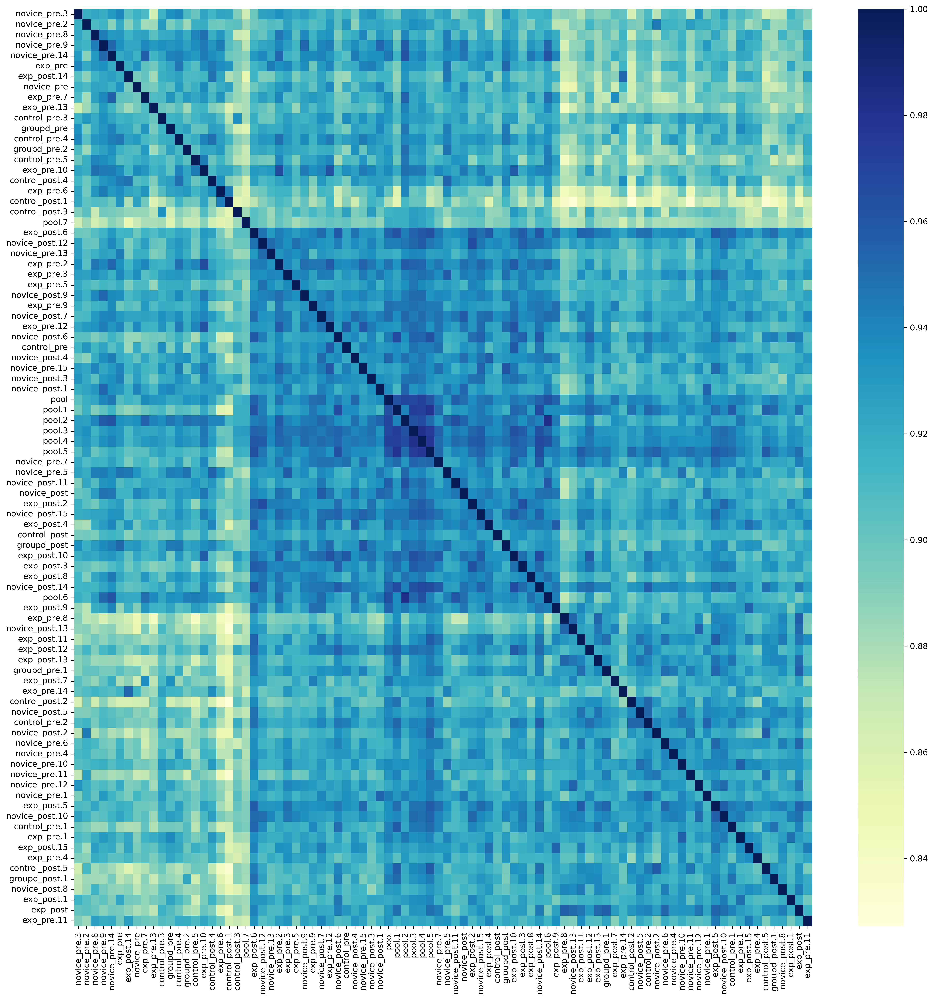

In [18]:
fig, ax = plt.subplots(figsize=(20,20))         # Sample figsize in inches
sns.heatmap(cluster_corr(dft.corr()), cmap='YlGnBu', ax=ax)

In [19]:
# reshape the d dataframe suitable for statsmodels package 
df_melt = pd.melt(dft.reset_index(), id_vars=['metabolite'], value_vars=['novice_pre', 'novice_post', 'exp_pre', 'exp_post', 'groupd_pre', 'groupd_post', 'control_pre', 'control_post', 'pool'])
# replace column names
df_melt.columns = ['index', 'group', 'value']
df_melt

,index,group,value
0,xylulose,novice_pre,10.646559
1,xylose,novice_pre,11.981567
2,xylitol,novice_pre,10.990813
3,valine,novice_pre,18.757742
4,uric acid,novice_pre,16.591858
...,...,...,...
4378,110,pool,11.196602
4379,98,pool,14.837825
4380,68,pool,17.027949
4381,61,pool,11.086800


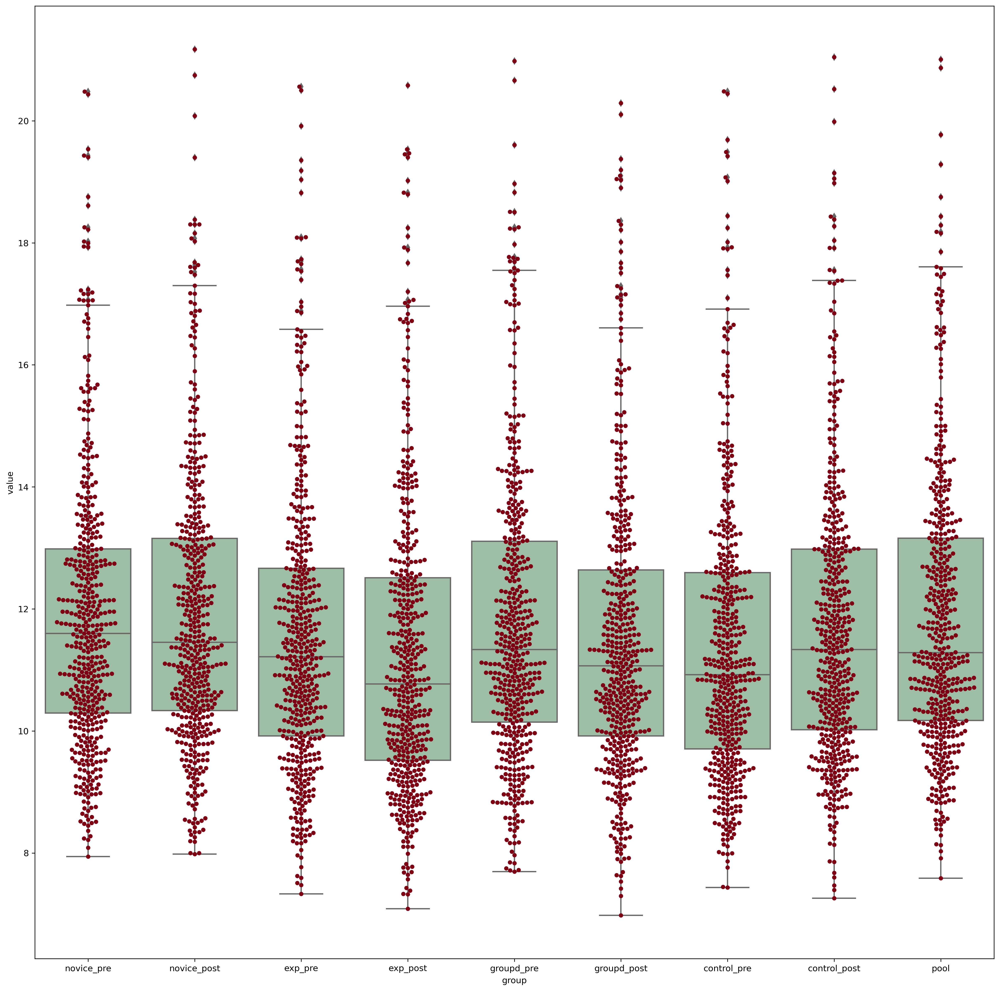

In [20]:
# generate a boxplot to see the data distribution
plt.figure(figsize=(20, 20))
ax = sns.boxplot(x='group', y='value', data=df_melt, color='#99c2a2')
ax = sns.swarmplot(x="group", y="value", data=df_melt, color='#7d0013')
plt.show()

In [21]:
df

,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7
metabolite,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
xylulose,1290,2112,1046,926,1106,890,1088,1050,1259,1403,1166,788,1138,1612,651,894,1398,569,1283,791,1343,1166,1388,1344,975,1236,1120,1235,1241,1584,1333,1613,1429,1266,1333,767,1292,862,1519,1029,1603,1594,1059,1629,933,1328,1077,1735,1546,1649,1735,1103,1243,1593,1242,1189,1247,1200,1245,1696,1227,1606,855,814,1597,1873,1634,935,1211,758,1339,1234,1274,2189,994,827,1569,867,1139,1279,1172,1265,1594,1155,846,1441,1508,932
xylose,3233,3726,2823,4138,4853,3804,3525,5340,2203,6668,6648,3677,4254,5547,1964,3734,3351,7070,3607,4081,3537,4614,74549,56804,3843,3688,2787,4690,2711,4243,8212,3971,13290,4417,14185,2965,4139,4672,2441,2224,4044,3822,5143,4648,3116,3817,3924,2858,3150,6454,5482,2592,4503,3519,25669,8728,4826,2810,2505,3187,15581,4073,9238,4438,68284,4205,3122,3019,5064,3234,7020,3127,5386,19342,2417,3237,3927,2168,6658,3036,8104,6342,8282,6168,6979,6307,8299,7817
xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109
valine,276131,288187,445771,747718,421332,388093,687899,219039,231204,482086,502335,373219,516675,260544,601783,717152,582775,617201,687413,281399,570384,482853,251066,467891,281536,549454,464481,519592,433613,517068,515781,466590,433615,679086,390731,750879,320589,568872,539901,253772,443244,352146,496728,636087,631247,407010,617442,430014,301897,294743,375008,457489,505554,521507,382317,670555,301978,552285,543101,254292,475512,292035,205897,608802,366284,541470,307233,624033,134242,551916,520175,426369,217877,371425,546934,563298,418838,573109,426019,230610,354517,529537,337474,543227,541503,534820,304721,524319
uric acid,114534,160807,55772,93506,61041,91720,67616,85281,43811,41397,113637,109697,40950,73902,57891,79101,123241,87044,59621,84710,149080,108049,103065,54081,77094,61132,72424,61649,65041,117765,98307,114793,110162,60139,41167,44967,71313,121430,49769,34736,98775,97389,75811,88457,96628,106125,117744,115433,46339,76542,175980,111604,71518,73929,79051,80795,149845,86200,132827,102806,119280,146239,86742,43448,79353,80526,73330,107980,111104,75065,89598,88540,152591,97430,45625,62143,73319,190247,97548,64119,78695,64839,88082,79491,70733,74259,59054,72656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [22]:
# Using a list comprehension to clean up headers
new_columns = ['.'.join(col.split('.')[:-1]) if '.' in col else col for col in dft.columns]

# Assigning the cleaned column names to the dataframe
dft.columns = new_columns

In [23]:
dft

,novice_post,novice_post,novice_post,novice_post,novice_post,novice_post,novice_post,novice_post,novice_post,novice_post,novice_post,novice_post,novice_post,novice_post,novice_post,exp_post,exp_post,exp_post,exp_post,exp_post,exp_post,exp_post,exp_post,exp_post,exp_post,exp_post,exp_post,exp_post,exp_post,control_post,control_post,control_post,control_post,groupd_post,exp_post,novice_post,control_post,groupd_post,control_post,exp_post,novice_pre,novice_pre,novice_pre,novice_pre,novice_pre,novice_pre,novice_pre,novice_pre,novice_pre,novice_pre,novice_pre,novice_pre,novice_pre,novice_pre,novice_pre,exp_pre,exp_pre,exp_pre,exp_pre,exp_pre,exp_pre,exp_pre,exp_pre,exp_pre,exp_pre,exp_pre,exp_pre,exp_pre,exp_pre,control_pre,control_pre,control_pre,control_pre,groupd_pre,exp_pre,novice_pre,control_pre,groupd_pre,groupd_pre,control_pre,pool,pool,pool,pool,pool,pool,pool,pool
metabolite,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
xylulose,10.333155,11.044394,10.030667,9.854868,10.111136,9.797662,10.087463,10.036174,10.298063,10.454299,10.187352,9.622052,10.152285,10.654636,9.346514,9.804131,10.449149,9.152285,10.325305,9.627534,10.391244,10.187352,10.438792,10.392317,9.929258,10.271463,10.129283,10.270295,10.277287,10.629357,10.380461,10.655531,10.480790,10.306062,10.380461,9.583083,10.335390,9.751544,10.568906,10.007027,10.646559,10.638436,10.048487,10.669771,9.865733,10.375039,10.072803,10.760720,10.594325,10.687376,10.760720,10.107217,10.279611,10.637531,10.278449,10.215533,10.284246,10.228819,10.281930,10.727920,10.260920,10.649256,9.739781,9.668885,10.641149,10.871135,10.674192,9.868823,10.241983,9.566054,10.386940,10.269127,10.315150,11.096056,9.957102,9.691744,10.615630,9.759888,10.153552,10.320801,10.194757,10.304922,10.638436,10.173677,9.724514,10.492855,10.558421,9.864186
xylose,11.658658,11.863412,11.463013,12.014718,12.244661,11.893302,11.783408,12.382624,11.105254,12.703038,12.698705,11.844313,12.054604,12.437492,10.939579,11.866506,11.710376,12.787494,11.816584,11.994707,11.788311,12.171802,16.185901,15.793705,11.908017,11.848623,11.444497,12.195372,11.404609,12.050869,13.003518,11.955287,13.698053,12.108851,13.792079,11.533816,12.015067,12.189825,11.253257,11.118941,11.981567,11.900112,12.328394,12.182394,11.605480,11.898223,11.938109,11.480790,11.621136,12.655978,12.420487,11.339850,12.136671,11.780950,14.647739,13.091435,12.236612,11.456354,11.290595,11.637983,13.927500,11.991876,13.173365,12.115694,16.059260,12.037890,11.608255,11.559855,12.306062,11.659104,12.777255,11.610564,12.394999,14.239449,11.239002,11.660442,11.939212,11.082149,12.700873,11.567956,12.984418,12.630722,13.015763,12.590587,12.768805,12.622738,13.018722,12.932399
xylitol,11.105909,10.837628,10.605480,10.399812,10.422065,11.043711,10.225207,10.782179,10.699572,11.194141,10.258566,10.653741,10.990813,10.870365,10.504819,10.592457,10.343186,11.116344,10.560333,10.689998,10.546894,10.874213,11.703038,11.340406,10.808964,10.868051,10.233620,10.858758,10.617467,15.874477,11.501340,10.795228,11.333155,10.488844,10.989394,10.342075,10.561288,13.637983,10.572700,10.396605,10.990813,10.970106,10.421013,10.784635,10.566054,11.176173,10.453271,10.903882,11.140191,11.036174,11.070121,10.771489,10.602699,10.905387,11.145932,10.941048,10.669771,11.277287,10.843136,11.064069,11.252074,10.828136,11.464546,11.067434,11.258566,11.308908,11.672425,10.885696,11.122828,10.330917,10.816184,11.098032,11.520128,10.920353,10.791163,10.659996,11.086136,10.870365,11.004923,10.674192,11.477252,11.197831,11.412041,11.222795,11.316282,11.062046,11.389631,11.602235
valine,18.074993,18.136646,18.765943,19.512135,18.684598,18.566043,19.391837,17.740828,17.818807,18.878931,18.938290,18.509663,18.978898,17.991168,19.198884,19.451919,19.152579,19.235381,19.390818,18.102258,19.121574,18.881225,17.937707,18.835813,18.102960,19.067639,18.825260,18.987020,18.726048,18.979994,18.976399,18.831796,18.726055,19.373235,18.575816,19.518221,18.290365,

In [24]:
df2transpose = dft.transpose()
df2transpose

metabolite,xylulose,xylose,xylitol,valine,uric acid,urea,tyrosine,tryptophan,trans-4-hydroxyproline,tocopherol gamma-,tocopherol beta,tocopherol alpha-,threonine,threonic acid,threitol,terephthalic acid,tartaric acid,tagatose,sucrose,succinic acid,stearic acid,shikimic acid,serine,salicylic acid,saccharic acid,ribonic acid,ribitol,quinic acid,pyruvic acid,pseudo uridine,proline,pipecolinic acid,phosphoethanolamine,phosphate,phenylethylamine,phenylalanine,phenoxyacetic acid,pentitol,p-cresol,para-xanthine,parabanic acid,palmitoleic acid,palmitic acid,oxoproline,oxalic acid,ornithine,oleic acid,nicotinic acid,N-formylglycine,N-acetylornithine,N-acetylmannosamine,N-acetylglycine,myristic acid,myo-inositol,methionine sulfoxide,methionine,methanolphosphate,mannose,maltose,maleimide,maleic acid,lyxose,lysine,linoleic acid,levoglucosan,leucine,lauric acid,lactose,lactic acid,kynurenine,ketoisoleucine,isothreonic acid,isopropylbenzene,isoleucine,isocitric acid,indole-3-propionic acid,indole-3-lactate,indole-3-acetate,hydroxyproline dipeptide,histidine,hippuric acid,heptadecanoic acid,glycolic acid,glycine,glycerol-alpha-phosphate,glycerol-3-galactoside,glycerol,glyceric acid,glutamine,glutamic acid,glucuronic acid,glucose-1-phosphate,glucose,gluconic acid,fumaric acid,fucose,fructose,ethanolamine,erythrose,erythritol,epsilon-caprolactam,deoxypentitol,deoxycholic acid,cystine,cysteine,creatinine,conduritol-beta-epoxide,citrulline,citric acid,cholesterol,caprylic acid,caproic acid,capric acid,beta-alanine,benzoic acid,aspartic acid,asparagine,arachidonic acid,arachidic acid,arabitol,alpha-ketoglutarate,alloxanoic acid,allantoic acid,alanine,adipic acid,adenosine-5-monophosphate,aconitic acid,acetophenone,9-myristoleate,5-hydroxynorvaline,3-phosphoglycerate,3-hydroxybutyric acid,3-aminoisobutyric acid,3-(1-pyrazolyl)-L-alanine,2-picolinic acid,2-ketoisovaleric acid,2-ketoisocaproic acid,2-hydroxyvaleric acid,2-hydroxyglutaric acid,2-hydroxybutanoic acid,2-deoxytetronic acid,2-aminobutyric acid,"2,5-dihydroxypyrazine","2,3-dihydroxybutanoic acid",1-monostearin,1-monopalmitin,509528,474299,474043,472871,471797,437830,425774,425117,421453,421324,418851,414134,414108,414102,414079,413991,413543,412430,408452,408446,408434,408428,408014,406851,401131,399917,397516,395914,395910,395232,393844,391869,391857,391740,390552,390549,390198,390194,390188,390179,390137,390135,390131,389988,389434,384914,384906,382579,379895,379853,379063,378765,378013,377998,377908,377384,376650,376648,371565,371561,371558,371546,371262,370223,367671,367626,367604,367427,367411,367398,367374,367356,367348,367340,367338,367321,367109,367104,366904,365909,365431,365155,359963,357403,356988,356926,356925,354281,354269,354252,354246,352123,351271,348279,348008,347190,346884,346561,346408,346164,345691,345452,345403,344945,344775,342924,342598,341366,329435,327416,324429,323784,321077,320849,319248,249248,233434,231827,231695,231666,231191,231137,230854,229949,223071,220689,220224,219819,214112,213228,210361,210272,210239,171564,170069,163872,161875,161341,160543,145494,135260,133778,133605,131694,127277,126350,124996,124881,122151,121468,120665,119167,119023,118791,117195,114258,112530,112264,110635,110628,110613,110612,110607,110605,110604,110321,110008,106936,106634,106278,103871,103162,100556,97678,97611,96539,94170,93947,93385,91421,87822,87792,87769,85113,62437,62409,62263,62250,50367,48608,48494,46362,46307,46292,46224,41805,41788,41750,41708,41699,41697,41691,41689,41683,41682,34135,34113,34007,33993,33468,33386,33282,32528,32247,31764,31664,31559,31357,31265,31263,26736,26720,22735,21817,21683,21513,21502,20903,20282,18488,18386,18176,18173,17651,17537,17267,17187,16794,16792,16788,14736,12444,11731,11481,11353,10962,9392,8841,8270,7826,7543,7490,7458,7409,7403,7053,6864,6802,6646,6580,6574,6538,6381,6376,6353,6331,6294,6115,5995,5990,5935,5930,5900,5884,5837,5482,5419,5288,5276,5259,5121,4986,4985,4983,4981,4956,4948,4945,4941,4938,4936,4933,4932,4929,4926,4925,4

In [25]:
df2transpose = df2transpose.reset_index()
df2transpose.head()

metabolite,index,xylulose,xylose,xylitol,valine,uric acid,urea,tyrosine,tryptophan,trans-4-hydroxyproline,tocopherol gamma-,tocopherol beta,tocopherol alpha-,threonine,threonic acid,threitol,terephthalic acid,tartaric acid,tagatose,sucrose,succinic acid,stearic acid,shikimic acid,serine,salicylic acid,saccharic acid,ribonic acid,ribitol,quinic acid,pyruvic acid,pseudo uridine,proline,pipecolinic acid,phosphoethanolamine,phosphate,phenylethylamine,phenylalanine,phenoxyacetic acid,pentitol,p-cresol,para-xanthine,parabanic acid,palmitoleic acid,palmitic acid,oxoproline,oxalic acid,ornithine,oleic acid,nicotinic acid,N-formylglycine,N-acetylornithine,N-acetylmannosamine,N-acetylglycine,myristic acid,myo-inositol,methionine sulfoxide,methionine,methanolphosphate,mannose,maltose,maleimide,maleic acid,lyxose,lysine,linoleic acid,levoglucosan,leucine,lauric acid,lactose,lactic acid,kynurenine,ketoisoleucine,isothreonic acid,isopropylbenzene,isoleucine,isocitric acid,indole-3-propionic acid,indole-3-lactate,indole-3-acetate,hydroxyproline dipeptide,histidine,hippuric acid,heptadecanoic acid,glycolic acid,glycine,glycerol-alpha-phosphate,glycerol-3-galactoside,glycerol,glyceric acid,glutamine,glutamic acid,glucuronic acid,glucose-1-phosphate,glucose,gluconic acid,fumaric acid,fucose,fructose,ethanolamine,erythrose,erythritol,epsilon-caprolactam,deoxypentitol,deoxycholic acid,cystine,cysteine,creatinine,conduritol-beta-epoxide,citrulline,citric acid,cholesterol,caprylic acid,caproic acid,capric acid,beta-alanine,benzoic acid,aspartic acid,asparagine,arachidonic acid,arachidic acid,arabitol,alpha-ketoglutarate,alloxanoic acid,allantoic acid,alanine,adipic acid,adenosine-5-monophosphate,aconitic acid,acetophenone,9-myristoleate,5-hydroxynorvaline,3-phosphoglycerate,3-hydroxybutyric acid,3-aminoisobutyric acid,3-(1-pyrazolyl)-L-alanine,2-picolinic acid,2-ketoisovaleric acid,2-ketoisocaproic acid,2-hydroxyvaleric acid,2-hydroxyglutaric acid,2-hydroxybutanoic acid,2-deoxytetronic acid,2-aminobutyric acid,"2,5-dihydroxypyrazine","2,3-dihydroxybutanoic acid",1-monostearin,1-monopalmitin,509528,474299,474043,472871,471797,437830,425774,425117,421453,421324,418851,414134,414108,414102,414079,413991,413543,412430,408452,408446,408434,408428,408014,406851,401131,399917,397516,395914,395910,395232,393844,391869,391857,391740,390552,390549,390198,390194,390188,390179,390137,390135,390131,389988,389434,384914,384906,382579,379895,379853,379063,378765,378013,377998,377908,377384,376650,376648,371565,371561,371558,371546,371262,370223,367671,367626,367604,367427,367411,367398,367374,367356,367348,367340,367338,367321,367109,367104,366904,365909,365431,365155,359963,357403,356988,356926,356925,354281,354269,354252,354246,352123,351271,348279,348008,347190,346884,346561,346408,346164,345691,345452,345403,344945,344775,342924,342598,341366,329435,327416,324429,323784,321077,320849,319248,249248,233434,231827,231695,231666,231191,231137,230854,229949,223071,220689,220224,219819,214112,213228,210361,210272,210239,171564,170069,163872,161875,161341,160543,145494,135260,133778,133605,131694,127277,126350,124996,124881,122151,121468,120665,119167,119023,118791,117195,114258,112530,112264,110635,110628,110613,110612,110607,110605,110604,110321,110008,106936,106634,106278,103871,103162,100556,97678,97611,96539,94170,93947,93385,91421,87822,87792,87769,85113,62437,62409,62263,62250,50367,48608,48494,46362,46307,46292,46224,41805,41788,41750,41708,41699,41697,41691,41689,41683,41682,34135,34113,34007,33993,33468,33386,33282,32528,32247,31764,31664,31559,31357,31265,31263,26736,26720,22735,21817,21683,21513,21502,20903,20282,18488,18386,18176,18173,17651,17537,17267,17187,16794,16792,16788,14736,12444,11731,11481,11353,10962,9392,8841,8270,7826,7543,7490,7458,7409,7403,7053,6864,6802,6646,6580,6574,6538,6381,6376,6353,6331,6294,6115,5995,5990,5935,5930,5900,5884,5837,5482,5419,5288,5276,5259,5121,4986,4985,4983,4981,4956,4948,4945,4941,4938,4936,4933,4932,4929,4926,

In [26]:
#assign all metabolite values in dataframe to x
x = df2transpose.iloc[:, 1: 487].values
#assign groups to y 
y = df2transpose.loc[:,['index']].values

#view x and y values
x, y

(array([[10.33315535, 11.65865779, 11.10590851, ..., 15.31160642,
         17.59299713, 11.55314928],
        [11.04439412, 11.86341196, 10.83762793, ..., 14.86050506,
         16.90900237, 10.94544384],
        [10.03066714, 11.46301341, 10.60547952, ..., 14.92044591,
         14.92448779, 10.16113188],
        ...,
        [10.49285462, 12.62273822, 11.06204614, ..., 14.7261117 ,
         15.03079644, 10.9822806 ],
        [10.55842071, 13.01872179, 11.38963134, ..., 14.83674076,
         17.97035309, 10.81297947],
        [ 9.86418614, 12.93239932, 11.6022349 , ..., 14.7300455 ,
         15.32125872, 11.52209107]]),
 array([['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post'],
        ['novice_post']

In [27]:
#Perform 2 component PCA analysis using sklearn
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
principalDf.head()

,principal component 1,principal component 2
0,-8.232402,4.638501
1,-7.850818,0.280815
2,8.169583,4.729137
3,-0.912551,-0.925830
4,-2.229066,2.004533


In [28]:
#Merge x PCA analysis with y (groups) into a single dataframe
finalDf = pd.concat([principalDf, df2transpose[['index']]], axis = 1)
finalDf.head(5)

,principal component 1,principal component 2,index
0,-8.232402,4.638501,novice_post
1,-7.850818,0.280815,novice_post
2,8.169583,4.729137,novice_post
3,-0.912551,-0.925830,novice_post
4,-2.229066,2.004533,novice_post


In [29]:
pca.explained_variance_ratio_

array([0.20496936, 0.07471049])

In [30]:
#Scale the data using Standardscaler from sklearn to remove  - this is important for PCA and machine learning processes
x = StandardScaler().fit_transform(x)
x

array([[ 0.23589339, -0.62737876,  0.16463507, ...,  2.19653839,
         1.44677941,  0.85133225],
       [ 2.14800343, -0.42036511, -0.22277773, ...,  0.91083206,
         0.86352444, -0.05114356],
       [-0.57732261, -0.8251821 , -0.55801357, ...,  1.08167244,
        -0.82870781, -1.2158897 ],
       ...,
       [ 0.66523244,  0.34734039,  0.10129525, ...,  0.5277909 ,
        -0.73805646,  0.00356105],
       [ 0.84150178,  0.74769368,  0.57434737, ...,  0.84310025,
         1.76855781, -0.24786039],
       [-1.02489379,  0.66041863,  0.88135931, ...,  0.53900283,
        -0.4903739 ,  0.80520911]])

In [31]:
#Perform 2 component PCA analysis using sklearn
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
principalDf.head()

,principal component 1,principal component 2
0,-13.618558,-10.056044
1,-12.026817,-1.717170
2,9.858165,-3.615736
3,1.793938,11.803137
4,-3.694494,-6.834826


In [32]:
#Merge x PCA analysis with y (groups) into a single dataframe
finalDf = pd.concat([principalDf, df2transpose[['index']]], axis = 1)
finalDf.head(5)

,principal component 1,principal component 2,index
0,-13.618558,-10.056044,novice_post
1,-12.026817,-1.717170,novice_post
2,9.858165,-3.615736,novice_post
3,1.793938,11.803137,novice_post
4,-3.694494,-6.834826,novice_post


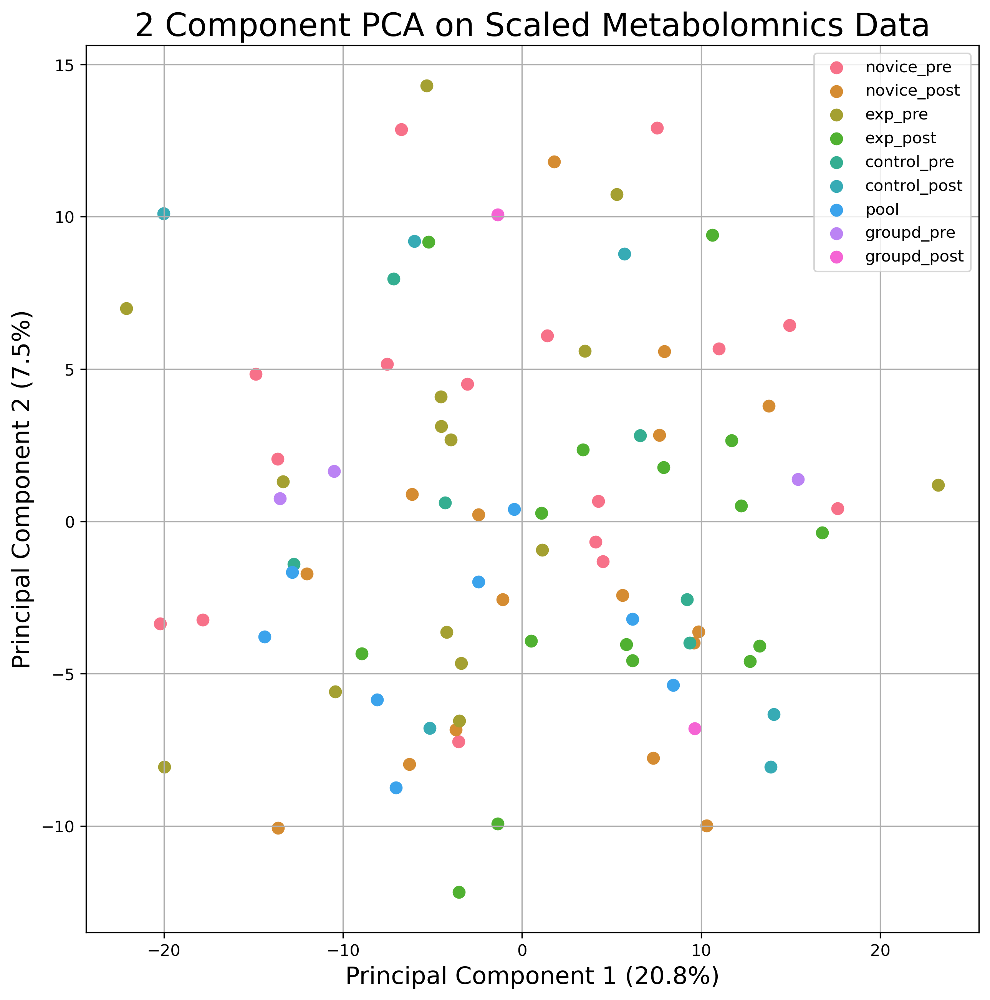

In [33]:
#Plot PCA dataframe
targets = ['novice_pre','novice_post', 'exp_pre', 'exp_post', 'control_pre', 'control_post', 'pool', 'groupd_pre', 'groupd_post']

colors = sns.color_palette("husl", len(targets))

fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1 (20.8%)', fontsize = 15)
ax.set_ylabel('Principal Component 2 (7.5%)', fontsize = 15)
ax.set_title('2 Component PCA on Scaled Metabolomnics Data', fontsize = 20)

for target, color in zip(targets, colors):
    indicesToKeep = finalDf['index'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = [color]
               , s = 50)
ax.legend(targets)
ax.grid()

In [34]:
pca.explained_variance_ratio_

array([0.20762584, 0.07470592])

In [35]:
#Perform 3 component PCA analysis using sklearn
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf.head()

,principal component 1,principal component 2,principal component 3
0,-13.618558,-10.056044,-0.771411
1,-12.026817,-1.717170,2.100250
2,9.858165,-3.615736,-3.210186
3,1.793938,11.803137,-7.493347
4,-3.694494,-6.834826,1.393417


In [36]:
pca.explained_variance_ratio_

array([0.20762584, 0.07470592, 0.05763582])

In [37]:
#Merge x PCA analysis with y (groups) into a single dataframe
finalDf = pd.concat([principalDf, df2transpose[['index']]], axis = 1)
finalDf.head(5)

,principal component 1,principal component 2,principal component 3,index
0,-13.618558,-10.056044,-0.771411,novice_post
1,-12.026817,-1.717170,2.100250,novice_post
2,9.858165,-3.615736,-3.210186,novice_post
3,1.793938,11.803137,-7.493347,novice_post
4,-3.694494,-6.834826,1.393417,novice_post


In [38]:
finalDf.columns = ['PC1','PC2','PC3','group']
finalDf

,PC1,PC2,PC3,group
0,-13.618558,-10.056044,-0.771411,novice_post
1,-12.026817,-1.717170,2.100250,novice_post
2,9.858165,-3.615736,-3.210186,novice_post
3,1.793938,11.803137,-7.493347,novice_post
4,-3.694494,-6.834826,1.393417,novice_post
...,...,...,...,...
83,-0.430248,0.404401,-5.986202,pool
84,-2.436666,-1.981101,-5.313758,pool
85,6.159945,-3.209111,-2.501604,pool
86,-14.376719,-3.788774,-0.690619,pool


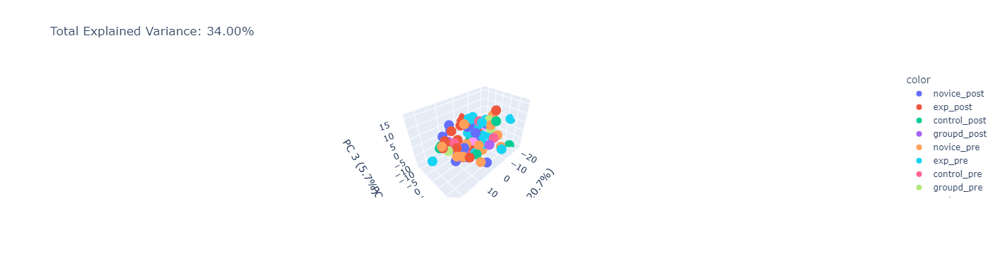

In [40]:
total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    principalComponents, x=0, y=1, z=2, color=finalDf['group'],
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1 (20.7%)', '1': 'PC 2 (7.5%)', '2': 'PC 3 (5.7%)'}
)
fig.show()

In [46]:
df2transpose

metabolite,index,xylulose,xylose,xylitol,valine,uric acid,urea,tyrosine,tryptophan,trans-4-hydroxyproline,tocopherol gamma-,tocopherol beta,tocopherol alpha-,threonine,threonic acid,threitol,terephthalic acid,tartaric acid,tagatose,sucrose,succinic acid,stearic acid,shikimic acid,serine,salicylic acid,saccharic acid,ribonic acid,ribitol,quinic acid,pyruvic acid,pseudo uridine,proline,pipecolinic acid,phosphoethanolamine,phosphate,phenylethylamine,phenylalanine,phenoxyacetic acid,pentitol,p-cresol,para-xanthine,parabanic acid,palmitoleic acid,palmitic acid,oxoproline,oxalic acid,ornithine,oleic acid,nicotinic acid,N-formylglycine,N-acetylornithine,N-acetylmannosamine,N-acetylglycine,myristic acid,myo-inositol,methionine sulfoxide,methionine,methanolphosphate,mannose,maltose,maleimide,maleic acid,lyxose,lysine,linoleic acid,levoglucosan,leucine,lauric acid,lactose,lactic acid,kynurenine,ketoisoleucine,isothreonic acid,isopropylbenzene,isoleucine,isocitric acid,indole-3-propionic acid,indole-3-lactate,indole-3-acetate,hydroxyproline dipeptide,histidine,hippuric acid,heptadecanoic acid,glycolic acid,glycine,glycerol-alpha-phosphate,glycerol-3-galactoside,glycerol,glyceric acid,glutamine,glutamic acid,glucuronic acid,glucose-1-phosphate,glucose,gluconic acid,fumaric acid,fucose,fructose,ethanolamine,erythrose,erythritol,epsilon-caprolactam,deoxypentitol,deoxycholic acid,cystine,cysteine,creatinine,conduritol-beta-epoxide,citrulline,citric acid,cholesterol,caprylic acid,caproic acid,capric acid,beta-alanine,benzoic acid,aspartic acid,asparagine,arachidonic acid,arachidic acid,arabitol,alpha-ketoglutarate,alloxanoic acid,allantoic acid,alanine,adipic acid,adenosine-5-monophosphate,aconitic acid,acetophenone,9-myristoleate,5-hydroxynorvaline,3-phosphoglycerate,3-hydroxybutyric acid,3-aminoisobutyric acid,3-(1-pyrazolyl)-L-alanine,2-picolinic acid,2-ketoisovaleric acid,2-ketoisocaproic acid,2-hydroxyvaleric acid,2-hydroxyglutaric acid,2-hydroxybutanoic acid,2-deoxytetronic acid,2-aminobutyric acid,"2,5-dihydroxypyrazine","2,3-dihydroxybutanoic acid",1-monostearin,1-monopalmitin,509528,474299,474043,472871,471797,437830,425774,425117,421453,421324,418851,414134,414108,414102,414079,413991,413543,412430,408452,408446,408434,408428,408014,406851,401131,399917,397516,395914,395910,395232,393844,391869,391857,391740,390552,390549,390198,390194,390188,390179,390137,390135,390131,389988,389434,384914,384906,382579,379895,379853,379063,378765,378013,377998,377908,377384,376650,376648,371565,371561,371558,371546,371262,370223,367671,367626,367604,367427,367411,367398,367374,367356,367348,367340,367338,367321,367109,367104,366904,365909,365431,365155,359963,357403,356988,356926,356925,354281,354269,354252,354246,352123,351271,348279,348008,347190,346884,346561,346408,346164,345691,345452,345403,344945,344775,342924,342598,341366,329435,327416,324429,323784,321077,320849,319248,249248,233434,231827,231695,231666,231191,231137,230854,229949,223071,220689,220224,219819,214112,213228,210361,210272,210239,171564,170069,163872,161875,161341,160543,145494,135260,133778,133605,131694,127277,126350,124996,124881,122151,121468,120665,119167,119023,118791,117195,114258,112530,112264,110635,110628,110613,110612,110607,110605,110604,110321,110008,106936,106634,106278,103871,103162,100556,97678,97611,96539,94170,93947,93385,91421,87822,87792,87769,85113,62437,62409,62263,62250,50367,48608,48494,46362,46307,46292,46224,41805,41788,41750,41708,41699,41697,41691,41689,41683,41682,34135,34113,34007,33993,33468,33386,33282,32528,32247,31764,31664,31559,31357,31265,31263,26736,26720,22735,21817,21683,21513,21502,20903,20282,18488,18386,18176,18173,17651,17537,17267,17187,16794,16792,16788,14736,12444,11731,11481,11353,10962,9392,8841,8270,7826,7543,7490,7458,7409,7403,7053,6864,6802,6646,6580,6574,6538,6381,6376,6353,6331,6294,6115,5995,5990,5935,5930,5900,5884,5837,5482,5419,5288,5276,5259,5121,4986,4985,4983,4981,4956,4948,4945,4941,4938,4936,4933,4932,4929,4926,

In [47]:
#Assign unique numbers based upon the index (genotype) column
df2transpose['group'] = df2transpose.groupby(['index']).ngroup()
df2transpose

metabolite,index,xylulose,xylose,xylitol,valine,uric acid,urea,tyrosine,tryptophan,trans-4-hydroxyproline,tocopherol gamma-,tocopherol beta,tocopherol alpha-,threonine,threonic acid,threitol,terephthalic acid,tartaric acid,tagatose,sucrose,succinic acid,stearic acid,shikimic acid,serine,salicylic acid,saccharic acid,ribonic acid,ribitol,quinic acid,pyruvic acid,pseudo uridine,proline,pipecolinic acid,phosphoethanolamine,phosphate,phenylethylamine,phenylalanine,phenoxyacetic acid,pentitol,p-cresol,para-xanthine,parabanic acid,palmitoleic acid,palmitic acid,oxoproline,oxalic acid,ornithine,oleic acid,nicotinic acid,N-formylglycine,N-acetylornithine,N-acetylmannosamine,N-acetylglycine,myristic acid,myo-inositol,methionine sulfoxide,methionine,methanolphosphate,mannose,maltose,maleimide,maleic acid,lyxose,lysine,linoleic acid,levoglucosan,leucine,lauric acid,lactose,lactic acid,kynurenine,ketoisoleucine,isothreonic acid,isopropylbenzene,isoleucine,isocitric acid,indole-3-propionic acid,indole-3-lactate,indole-3-acetate,hydroxyproline dipeptide,histidine,hippuric acid,heptadecanoic acid,glycolic acid,glycine,glycerol-alpha-phosphate,glycerol-3-galactoside,glycerol,glyceric acid,glutamine,glutamic acid,glucuronic acid,glucose-1-phosphate,glucose,gluconic acid,fumaric acid,fucose,fructose,ethanolamine,erythrose,erythritol,epsilon-caprolactam,deoxypentitol,deoxycholic acid,cystine,cysteine,creatinine,conduritol-beta-epoxide,citrulline,citric acid,cholesterol,caprylic acid,caproic acid,capric acid,beta-alanine,benzoic acid,aspartic acid,asparagine,arachidonic acid,arachidic acid,arabitol,alpha-ketoglutarate,alloxanoic acid,allantoic acid,alanine,adipic acid,adenosine-5-monophosphate,aconitic acid,acetophenone,9-myristoleate,5-hydroxynorvaline,3-phosphoglycerate,3-hydroxybutyric acid,3-aminoisobutyric acid,3-(1-pyrazolyl)-L-alanine,2-picolinic acid,2-ketoisovaleric acid,2-ketoisocaproic acid,2-hydroxyvaleric acid,2-hydroxyglutaric acid,2-hydroxybutanoic acid,2-deoxytetronic acid,2-aminobutyric acid,"2,5-dihydroxypyrazine","2,3-dihydroxybutanoic acid",1-monostearin,1-monopalmitin,509528,474299,474043,472871,471797,437830,425774,425117,421453,421324,418851,414134,414108,414102,414079,413991,413543,412430,408452,408446,408434,408428,408014,406851,401131,399917,397516,395914,395910,395232,393844,391869,391857,391740,390552,390549,390198,390194,390188,390179,390137,390135,390131,389988,389434,384914,384906,382579,379895,379853,379063,378765,378013,377998,377908,377384,376650,376648,371565,371561,371558,371546,371262,370223,367671,367626,367604,367427,367411,367398,367374,367356,367348,367340,367338,367321,367109,367104,366904,365909,365431,365155,359963,357403,356988,356926,356925,354281,354269,354252,354246,352123,351271,348279,348008,347190,346884,346561,346408,346164,345691,345452,345403,344945,344775,342924,342598,341366,329435,327416,324429,323784,321077,320849,319248,249248,233434,231827,231695,231666,231191,231137,230854,229949,223071,220689,220224,219819,214112,213228,210361,210272,210239,171564,170069,163872,161875,161341,160543,145494,135260,133778,133605,131694,127277,126350,124996,124881,122151,121468,120665,119167,119023,118791,117195,114258,112530,112264,110635,110628,110613,110612,110607,110605,110604,110321,110008,106936,106634,106278,103871,103162,100556,97678,97611,96539,94170,93947,93385,91421,87822,87792,87769,85113,62437,62409,62263,62250,50367,48608,48494,46362,46307,46292,46224,41805,41788,41750,41708,41699,41697,41691,41689,41683,41682,34135,34113,34007,33993,33468,33386,33282,32528,32247,31764,31664,31559,31357,31265,31263,26736,26720,22735,21817,21683,21513,21502,20903,20282,18488,18386,18176,18173,17651,17537,17267,17187,16794,16792,16788,14736,12444,11731,11481,11353,10962,9392,8841,8270,7826,7543,7490,7458,7409,7403,7053,6864,6802,6646,6580,6574,6538,6381,6376,6353,6331,6294,6115,5995,5990,5935,5930,5900,5884,5837,5482,5419,5288,5276,5259,5121,4986,4985,4983,4981,4956,4948,4945,4941,4938,4936,4933,4932,4929,4926,

In [48]:
#set the index
dfidgroups = df2transpose.set_index('index')
dfidgroups 

metabolite,xylulose,xylose,xylitol,valine,uric acid,urea,tyrosine,tryptophan,trans-4-hydroxyproline,tocopherol gamma-,tocopherol beta,tocopherol alpha-,threonine,threonic acid,threitol,terephthalic acid,tartaric acid,tagatose,sucrose,succinic acid,stearic acid,shikimic acid,serine,salicylic acid,saccharic acid,ribonic acid,ribitol,quinic acid,pyruvic acid,pseudo uridine,proline,pipecolinic acid,phosphoethanolamine,phosphate,phenylethylamine,phenylalanine,phenoxyacetic acid,pentitol,p-cresol,para-xanthine,parabanic acid,palmitoleic acid,palmitic acid,oxoproline,oxalic acid,ornithine,oleic acid,nicotinic acid,N-formylglycine,N-acetylornithine,N-acetylmannosamine,N-acetylglycine,myristic acid,myo-inositol,methionine sulfoxide,methionine,methanolphosphate,mannose,maltose,maleimide,maleic acid,lyxose,lysine,linoleic acid,levoglucosan,leucine,lauric acid,lactose,lactic acid,kynurenine,ketoisoleucine,isothreonic acid,isopropylbenzene,isoleucine,isocitric acid,indole-3-propionic acid,indole-3-lactate,indole-3-acetate,hydroxyproline dipeptide,histidine,hippuric acid,heptadecanoic acid,glycolic acid,glycine,glycerol-alpha-phosphate,glycerol-3-galactoside,glycerol,glyceric acid,glutamine,glutamic acid,glucuronic acid,glucose-1-phosphate,glucose,gluconic acid,fumaric acid,fucose,fructose,ethanolamine,erythrose,erythritol,epsilon-caprolactam,deoxypentitol,deoxycholic acid,cystine,cysteine,creatinine,conduritol-beta-epoxide,citrulline,citric acid,cholesterol,caprylic acid,caproic acid,capric acid,beta-alanine,benzoic acid,aspartic acid,asparagine,arachidonic acid,arachidic acid,arabitol,alpha-ketoglutarate,alloxanoic acid,allantoic acid,alanine,adipic acid,adenosine-5-monophosphate,aconitic acid,acetophenone,9-myristoleate,5-hydroxynorvaline,3-phosphoglycerate,3-hydroxybutyric acid,3-aminoisobutyric acid,3-(1-pyrazolyl)-L-alanine,2-picolinic acid,2-ketoisovaleric acid,2-ketoisocaproic acid,2-hydroxyvaleric acid,2-hydroxyglutaric acid,2-hydroxybutanoic acid,2-deoxytetronic acid,2-aminobutyric acid,"2,5-dihydroxypyrazine","2,3-dihydroxybutanoic acid",1-monostearin,1-monopalmitin,509528,474299,474043,472871,471797,437830,425774,425117,421453,421324,418851,414134,414108,414102,414079,413991,413543,412430,408452,408446,408434,408428,408014,406851,401131,399917,397516,395914,395910,395232,393844,391869,391857,391740,390552,390549,390198,390194,390188,390179,390137,390135,390131,389988,389434,384914,384906,382579,379895,379853,379063,378765,378013,377998,377908,377384,376650,376648,371565,371561,371558,371546,371262,370223,367671,367626,367604,367427,367411,367398,367374,367356,367348,367340,367338,367321,367109,367104,366904,365909,365431,365155,359963,357403,356988,356926,356925,354281,354269,354252,354246,352123,351271,348279,348008,347190,346884,346561,346408,346164,345691,345452,345403,344945,344775,342924,342598,341366,329435,327416,324429,323784,321077,320849,319248,249248,233434,231827,231695,231666,231191,231137,230854,229949,223071,220689,220224,219819,214112,213228,210361,210272,210239,171564,170069,163872,161875,161341,160543,145494,135260,133778,133605,131694,127277,126350,124996,124881,122151,121468,120665,119167,119023,118791,117195,114258,112530,112264,110635,110628,110613,110612,110607,110605,110604,110321,110008,106936,106634,106278,103871,103162,100556,97678,97611,96539,94170,93947,93385,91421,87822,87792,87769,85113,62437,62409,62263,62250,50367,48608,48494,46362,46307,46292,46224,41805,41788,41750,41708,41699,41697,41691,41689,41683,41682,34135,34113,34007,33993,33468,33386,33282,32528,32247,31764,31664,31559,31357,31265,31263,26736,26720,22735,21817,21683,21513,21502,20903,20282,18488,18386,18176,18173,17651,17537,17267,17187,16794,16792,16788,14736,12444,11731,11481,11353,10962,9392,8841,8270,7826,7543,7490,7458,7409,7403,7053,6864,6802,6646,6580,6574,6538,6381,6376,6353,6331,6294,6115,5995,5990,5935,5930,5900,5884,5837,5482,5419,5288,5276,5259,5121,4986,4985,4983,4981,4956,4948,4945,4941,4938,4936,4933,4932,4929,4926,4925,4

In [49]:
#create a color palette with the same number of colors as unique values in the Source column
network_pal = sns.color_palette('Paired', len(dfidgroups.group.unique()))

#Create a dictionary where the key is the category and the values are the
#colors from the palette we just created
network_lut = dict(zip(dfidgroups.group.unique(), network_pal))

#get the series of all of the categories
networks = dfidgroups.group

#map the colors to the series. Now we have a list of colors the same
#length as our dataframe, where unique values are mapped to the same color
network_colors = pd.Series(networks).map(network_lut)

#plot the heatmap with the 16S and ITS categories with the network colors
#defined by Source column
g = sns.clustermap(dfidgroups, method='ward', robust=True, figsize=(30, 30), cmap="YlGnBu", linewidths=0.1, cbar_pos=(1.05, .2, .04, .5), row_colors=network_colors)
ax = g.ax_heatmap
ax.set_xlabel("Group", fontsize=25)
ax.set_ylabel("Metabolite", fontsize=25)
ax.set_title('Hierarchical Clustering of Orlando Meditators', y=1.3, fontsize=30)

# Create a legend for the row colors
for label, color in network_lut.items():
    g.ax_col_dendrogram.bar(0, 0, color=color, label=label, linewidth=0)
g.ax_col_dendrogram.legend(loc="center", ncol=1, title="Group")

In [50]:
# Create a reverse mapping from group numbers to index names
group_to_index = df2transpose[['group', 'index']].set_index('group').to_dict()['index']

# Update your color dictionary to map index names instead of group numbers to colors
index_lut = {group_to_index[key]: value for key, value in network_lut.items()}

# Use index names instead of group numbers for the series
network_names = dfidgroups.group.map(group_to_index)

# Map the colors to the series using the updated dictionary
network_colors = pd.Series(network_names).map(index_lut)

In [53]:
#plot the heatmap with the 16S and ITS categories with the network colors
#defined by Source column
g = sns.clustermap(dfidgroups, method = 'median', robust=True, figsize=(30, 30), cmap="YlGnBu", linewidths=0.1, cbar_pos=(1.05, .2, .04, .5), row_colors=network_colors)
ax = g.ax_heatmap
ax.set_xlabel("Group", fontsize=25)
ax.set_ylabel("Metabolite", fontsize=25)
ax.set_title('Hierarchical Clustering of Orlando Meditators', y=1.3, fontsize=30)

# Define FontProperties for the title
title_font = FontProperties(weight='bold', size='20')

# Modify the legend creation to use sorted index names
for label, color in sorted(index_lut.items()):
    g.ax_col_dendrogram.bar(0, 0, color=color, label=label, linewidth=0)
g.ax_col_dendrogram.legend(loc="upper left", ncol=1, bbox_to_anchor=(-.25, 1.005), fontsize="20", title="Group", title_fontproperties=title_font, frameon=False,)

## Silhouette Score: 

Measures how similar an object is to its own cluster compared to other clusters. 

#### The silhouette score ranges from -1 to 1, 

where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

In [54]:
from scipy.cluster.hierarchy import linkage

# Assuming dfidgroups is your data
Z = linkage(dfidgroups, method='median')

In [55]:
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import fcluster

# Assuming linkage matrix Z has been computed
k = 3  # desired number of clusters
clusters = fcluster(Z, k, criterion='maxclust')

# Calculate silhouette score
score = silhouette_score(dfidgroups, clusters)

print("Silhouette Score:", score)

Silhouette Score: 0.13143198958793453


# Binary comparisons

## Control pre vs. control post

In [56]:
df = df.reset_index()

In [57]:
Grp1 = ['control_pre', 'control_pre.1', 'control_pre.2', 'control_pre.3', 'control_pre.4', 'control_pre.5']
Grp2 = ['control_post', 'control_post.1', 'control_post.2', 'control_post.3', 'control_post.4', 'control_post.5']

Grp1_df = df[Grp1]
Grp2_df = df[Grp2]

Grp1_df.describe()

,control_pre,control_pre.1,control_pre.2,control_pre.3,control_pre.4,control_pre.5
count,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02
mean,2.428267e+04,2.590202e+04,2.406269e+04,2.623559e+04,2.552310e+04,2.724590e+04
std,1.196388e+05,1.396652e+05,1.174727e+05,1.429754e+05,1.233812e+05,1.348187e+05
min,1.730000e+02,9.400000e+01,4.600000e+01,1.640000e+02,1.180000e+02,1.940000e+02
25%,8.350000e+02,8.885000e+02,7.615000e+02,1.098500e+03,9.865000e+02,1.050500e+03
50%,1.942000e+03,2.065000e+03,2.151000e+03,2.321000e+03,2.456000e+03,2.768000e+03
75%,6.193500e+03,6.955000e+03,6.694500e+03,7.595500e+03,7.605000e+03,7.705000e+03
max,1.467147e+06,2.123927e+06,1.689044e+06,2.218793e+06,1.637231e+06,1.982935e+06


In [58]:
Grp2Grp1 = TwoCategoryMaster(df, Grp2_df, Grp1_df,"Grp2","Grp1")
Grp2Grp1


,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
0,xylulose,1290,2112,1046,926,1106,890,1088,1050,1259,1403,1166,788,1138,1612,651,894,1398,569,1283,791,1343,1166,1388,1344,975,1236,1120,1235,1241,1584,1333,1613,1429,1266,1333,767,1292,862,1519,1029,1603,1594,1059,1629,933,1328,1077,1735,1546,1649,1735,1103,1243,1593,1242,1189,1247,1200,1245,1696,1227,1606,855,814,1597,1873,1634,935,1211,758,1339,1234,1274,2189,994,827,1569,867,1139,1279,1172,1265,1594,1155,846,1441,1508,932,0.111066,1461.666667,1242.166667,1.176707,0.234756,0.954419,2.240552e-01
1,xylose,3233,3726,2823,4138,4853,3804,3525,5340,2203,6668,6648,3677,4254,5547,1964,3734,3351,7070,3607,4081,3537,4614,74549,56804,3843,3688,2787,4690,2711,4243,8212,3971,13290,4417,14185,2965,4139,4672,2441,2224,4044,3822,5143,4648,3116,3817,3924,2858,3150,6454,5482,2592,4503,3519,25669,8728,4826,2810,2505,3187,15581,4073,9238,4438,68284,4205,3122,3019,5064,3234,7020,3127,5386,19342,2417,3237,3927,2168,6658,3036,8104,6342,8282,6168,6979,6307,8299,7817,0.355627,6049.333333,4288.333333,1.410649,0.496359,0.449005,2.228677e-01
2,xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109,0.361006,11727.500000,2004.666667,5.850100,2.548461,0.442485,1.127657e+00
3,valine,276131,288187,445771,747718,421332,388093,687899,219039,231204,482086,502335,373219,516675,260544,601783,717152,582775,617201,687413,281399,570384,482853,251066,467891,281536,549454,464481,519592,433613,517068,515781,466590,433615,679086,390731,750879,320589,568872,539901,253772,443244,352146,496728,636087,631247,407010,617442,430014,301897,294743,375008,457489,505554,521507,382317,670555,301978,552285,543101,254292,475512,292035,205897,608802,366284,541470,307233,624033,134242,551916,520175,426369,217877,371425,546934,563298,418838,573109,426019,230610,354517,529537,337474,543227,541503,534820,304721,524319,0.315671,465590.666667,394297.500000,1.180811,0.239778,0.500766,1.200724e-01
4,uric acid,114534,160807,55772,93506,61041,91720,67616,85281,43811,41397,113637,109697,40950,73902,57891,79101,123241,87044,59621,84710,149080,108049,103065,54081,77094,61132,72424,61649,65041,117765,98307,114793,110162,60139,41167,44967,71313,121430,49769,34736,98775,97389,75811,88457,96628,106125,117744,115433,46339,76542,175980,111604,71518,73929,79051,80795,149845,86200,132827,102806,119280,146239,86742,43448,79353,80526,73330,107980,111104,75065,89598,88540,152591,97430,45625,62143,73319,190247,97548,64119,78695,64839,88082,79491,70733,74259,59054

In [59]:
top10 = df['Grp2/Grp1 pi score'].nlargest(10)
low10 = df['Grp2/Grp1 pi score'].nsmallest(10)

top10df = df[df['Grp2/Grp1 pi score'].isin(top10)]
low10df = df[df['Grp2/Grp1 pi score'].isin(low10)]

In [60]:
#Subset out the significant proteins to a new dataframe
control_sign= df[(abs(df['Grp2/Grp1 pi score']) > (1))]
control_sign

,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
2,xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109,0.361006,11727.500000,2004.666667,5.850100,2.548461,0.442485,1.127657
13,threonic acid,18019,28482,27612,8511,11251,11139,12880,15181,16630,24472,12905,13562,12934,24422,7157,16600,20074,12073,13076,15373,15711,8379,30210,17417,16695,12764,15568,28566,20958,19365,12154,27267,14852,10032,11300,12800,3305,10500,20803,11400,7810,14419,19990,8050,2358,16150,8615,13712,16116,26782,9811,6403,25092,18797,11897,6429,11908,7095,20540,14357,17097,13653,26143,12240,15861,8161,11986,7017,10335,9568,8465,8620,9188,32359,6060,6790,2678,4945,11986,11062,15662,13173,16473,13490,12453,12489,14020,18334,0.063383,16291.000000,8263.500000,1.971441,0.979250,1.198024,1.173166
23,salicylic acid,727,1195,1189,509,853,672,4803,649,1347,3825,888,2669,1436,987,2005,403,27158,1643,716,1005,1000,1107,598,1116,548,737,385,625,1310,3171,593,129783,1576,742,507,444,432,967,1145,869,425,1487,1183,688,712,1025,505,672,1271,7351,1844,1893,698,904,1015,531,83874,716,1133,532,583,1056,972,831,1072,1027,1116,828,1107044,993,901,1573,768,1241,440,346,968,630,728,643,19225,16439,16305,14546,16764,15040,17443,22203,0.354981,22783.333333,974.333333,23.383510,4.547420,0.449795,2.045406
37,pentitol,343,318,453,233,301,408,213,428,379,351,491,118,378,447,227,309,316,387,352,383,163,355,161,25,285,341,231,219,424,10806,775,438,232,283,463,198,367,213,327,291,413,530,199,403,219,240,257,129,249,350,294,203,388,335,456,360,464,258,301,335,202,342,387,558,283,326,545,473,384,317,339,430,853,211,435,333,317,393,446,257,495,283,580,335,450,343,316,633,0.361726,2157.500000,418.833333,5.151214,2.364912,0.441621,1.044394
41,palmitoleic acid,2644,547,257,548,1788,436,1096,3564,2124,4518,516,2085,643,451,1516,994,326,665,863,7663,1806,4003,785,3421,6900,2280,5132,1617,498,620,543,682,384,3047,1120,1713,1039,433,1097,4189,2964,483,189,401,595,413,1586,5343,1978,965,647,2840,990,653,2785,468,606,9992,1190,3771,373,912,2359,1285,5097,2745,4363,3917,5757,1953,1475,402,541,1810,853,8665,2637,5109,1512,4142,2593,2244,2260,1948,2278,2046,2238,2103,0.106274,727.500000,1858.333333,0.391480,-1.352990,0.973574,-1.317236
46,oleic acid,29651,6062,13882,18465,45600,16544,18265,60414,41953,1470,13482,32398,13880,13958,30068,21003,6945,11491,18179,64851,43587,43222,5994,46334,86335,45520,63137,28647,13567,7437,11067,13972,11000,52712,26675,34151,16925,23789,30653,66893,30108,5130,6623,13214,11588,2

### Metabolites considered significantly different (by pi score)

In [61]:
control_sign

,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
2,xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109,0.361006,11727.500000,2004.666667,5.850100,2.548461,0.442485,1.127657
13,threonic acid,18019,28482,27612,8511,11251,11139,12880,15181,16630,24472,12905,13562,12934,24422,7157,16600,20074,12073,13076,15373,15711,8379,30210,17417,16695,12764,15568,28566,20958,19365,12154,27267,14852,10032,11300,12800,3305,10500,20803,11400,7810,14419,19990,8050,2358,16150,8615,13712,16116,26782,9811,6403,25092,18797,11897,6429,11908,7095,20540,14357,17097,13653,26143,12240,15861,8161,11986,7017,10335,9568,8465,8620,9188,32359,6060,6790,2678,4945,11986,11062,15662,13173,16473,13490,12453,12489,14020,18334,0.063383,16291.000000,8263.500000,1.971441,0.979250,1.198024,1.173166
23,salicylic acid,727,1195,1189,509,853,672,4803,649,1347,3825,888,2669,1436,987,2005,403,27158,1643,716,1005,1000,1107,598,1116,548,737,385,625,1310,3171,593,129783,1576,742,507,444,432,967,1145,869,425,1487,1183,688,712,1025,505,672,1271,7351,1844,1893,698,904,1015,531,83874,716,1133,532,583,1056,972,831,1072,1027,1116,828,1107044,993,901,1573,768,1241,440,346,968,630,728,643,19225,16439,16305,14546,16764,15040,17443,22203,0.354981,22783.333333,974.333333,23.383510,4.547420,0.449795,2.045406
37,pentitol,343,318,453,233,301,408,213,428,379,351,491,118,378,447,227,309,316,387,352,383,163,355,161,25,285,341,231,219,424,10806,775,438,232,283,463,198,367,213,327,291,413,530,199,403,219,240,257,129,249,350,294,203,388,335,456,360,464,258,301,335,202,342,387,558,283,326,545,473,384,317,339,430,853,211,435,333,317,393,446,257,495,283,580,335,450,343,316,633,0.361726,2157.500000,418.833333,5.151214,2.364912,0.441621,1.044394
41,palmitoleic acid,2644,547,257,548,1788,436,1096,3564,2124,4518,516,2085,643,451,1516,994,326,665,863,7663,1806,4003,785,3421,6900,2280,5132,1617,498,620,543,682,384,3047,1120,1713,1039,433,1097,4189,2964,483,189,401,595,413,1586,5343,1978,965,647,2840,990,653,2785,468,606,9992,1190,3771,373,912,2359,1285,5097,2745,4363,3917,5757,1953,1475,402,541,1810,853,8665,2637,5109,1512,4142,2593,2244,2260,1948,2278,2046,2238,2103,0.106274,727.500000,1858.333333,0.391480,-1.352990,0.973574,-1.317236
46,oleic acid,29651,6062,13882,18465,45600,16544,18265,60414,41953,1470,13482,32398,13880,13958,30068,21003,6945,11491,18179,64851,43587,43222,5994,46334,86335,45520,63137,28647,13567,7437,11067,13972,11000,52712,26675,34151,16925,23789,30653,66893,30108,5130,6623,13214,11588,2

### Export these metabolites as a csv file

In [62]:
#Export dataframe to csv with index
control_sign.to_csv(r'./control_significant_piscores.csv')

### Plot the metabolites

In [63]:
significantdf = control_sign

In [64]:
significantdf = significantdf.reset_index()
significantdf

,index,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
0,2,xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109,0.361006,11727.500000,2004.666667,5.850100,2.548461,0.442485,1.127657
1,13,threonic acid,18019,28482,27612,8511,11251,11139,12880,15181,16630,24472,12905,13562,12934,24422,7157,16600,20074,12073,13076,15373,15711,8379,30210,17417,16695,12764,15568,28566,20958,19365,12154,27267,14852,10032,11300,12800,3305,10500,20803,11400,7810,14419,19990,8050,2358,16150,8615,13712,16116,26782,9811,6403,25092,18797,11897,6429,11908,7095,20540,14357,17097,13653,26143,12240,15861,8161,11986,7017,10335,9568,8465,8620,9188,32359,6060,6790,2678,4945,11986,11062,15662,13173,16473,13490,12453,12489,14020,18334,0.063383,16291.000000,8263.500000,1.971441,0.979250,1.198024,1.173166
2,23,salicylic acid,727,1195,1189,509,853,672,4803,649,1347,3825,888,2669,1436,987,2005,403,27158,1643,716,1005,1000,1107,598,1116,548,737,385,625,1310,3171,593,129783,1576,742,507,444,432,967,1145,869,425,1487,1183,688,712,1025,505,672,1271,7351,1844,1893,698,904,1015,531,83874,716,1133,532,583,1056,972,831,1072,1027,1116,828,1107044,993,901,1573,768,1241,440,346,968,630,728,643,19225,16439,16305,14546,16764,15040,17443,22203,0.354981,22783.333333,974.333333,23.383510,4.547420,0.449795,2.045406
3,37,pentitol,343,318,453,233,301,408,213,428,379,351,491,118,378,447,227,309,316,387,352,383,163,355,161,25,285,341,231,219,424,10806,775,438,232,283,463,198,367,213,327,291,413,530,199,403,219,240,257,129,249,350,294,203,388,335,456,360,464,258,301,335,202,342,387,558,283,326,545,473,384,317,339,430,853,211,435,333,317,393,446,257,495,283,580,335,450,343,316,633,0.361726,2157.500000,418.833333,5.151214,2.364912,0.441621,1.044394
4,41,palmitoleic acid,2644,547,257,548,1788,436,1096,3564,2124,4518,516,2085,643,451,1516,994,326,665,863,7663,1806,4003,785,3421,6900,2280,5132,1617,498,620,543,682,384,3047,1120,1713,1039,433,1097,4189,2964,483,189,401,595,413,1586,5343,1978,965,647,2840,990,653,2785,468,606,9992,1190,3771,373,912,2359,1285,5097,2745,4363,3917,5757,1953,1475,402,541,1810,853,8665,2637,5109,1512,4142,2593,2244,2260,1948,2278,2046,2238,2103,0.106274,727.500000,1858.333333,0.391480,-1.352990,0.973574,-1.317236
5,46,oleic acid,29651,6062,13882,18465,45600,16544,18265,60414,41953,1470,13482,32398,13880,13958,30068,21003,6945,11491,18179,64851,43587,43222,5994,46334,86335,45520,63137,28647,13567,7437,11067,13972,11000,52712,26675,34151,16925,23789,30653,66893,30108,5130,

In [65]:
def volcanotop10(df, significantdf, top10high, top10low, foldchange, pvalue, savename):
    plt.figure(figsize=(10, 10))
    
    # Plotting non-significant points
    plt.scatter(df['%s' % (foldchange)], df['%s' % (pvalue)], c='#a6bddb', s=20, label='Not significant')
    
    # Plotting and annotating significant points
    plt.scatter(significantdf['%s' % (foldchange)], significantdf['%s' % (pvalue)], c='#ffeda0', s=50, label='Significant')
    for index, row in significantdf.iterrows():
        plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')

        # Plotting and annotating top 10 high points
    #plt.scatter(top10high['%s' % (foldchange)], top10high['%s' % (pvalue)], c='r', s=50, label='Top 10 Grp2')
    #for index, row in top10high.iterrows():
        #plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')
    
    # Plotting and annotating top 10 low points
    #plt.scatter(top10low['%s' % (foldchange)], top10low['%s' % (pvalue)], c='b', s=50, label='Top 10 Grp1')
    #for index, row in top10low.iterrows():
        #plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')
    

    plt.ylabel('-Log(P-value)', fontsize=18)
    plt.xlabel('Fold Change', fontsize=18)
    plt.xlim([-2, 2])  # For example, to set x-axis limits 
    plt.ylim([0, 6])  # For example, to set y-axis limits
    plt.title('Metabolomic Effects of Orlando Meditation Conference on Control Group')
    plt.legend(scatterpoints=1)
    plt.savefig('%s' % (savename))

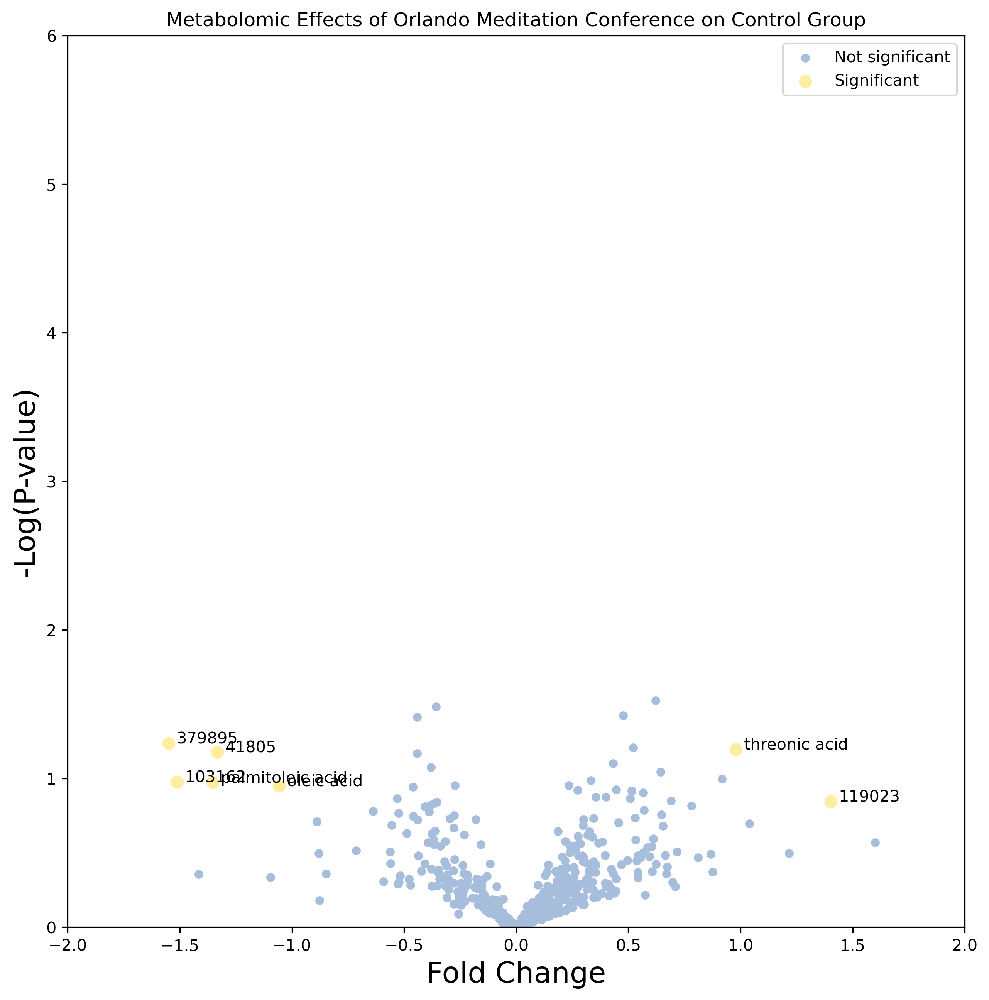

In [66]:
volcanotop10(df,significantdf,top10df,low10df,'Log2(Fold Change)','-Log(P-value)', 'Volcano_Plot_nooutlier.pdf')

## Novice Pre vs. Post

In [67]:
df

,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
0,xylulose,1290,2112,1046,926,1106,890,1088,1050,1259,1403,1166,788,1138,1612,651,894,1398,569,1283,791,1343,1166,1388,1344,975,1236,1120,1235,1241,1584,1333,1613,1429,1266,1333,767,1292,862,1519,1029,1603,1594,1059,1629,933,1328,1077,1735,1546,1649,1735,1103,1243,1593,1242,1189,1247,1200,1245,1696,1227,1606,855,814,1597,1873,1634,935,1211,758,1339,1234,1274,2189,994,827,1569,867,1139,1279,1172,1265,1594,1155,846,1441,1508,932,0.111066,1461.666667,1242.166667,1.176707,0.234756,0.954419,2.240552e-01
1,xylose,3233,3726,2823,4138,4853,3804,3525,5340,2203,6668,6648,3677,4254,5547,1964,3734,3351,7070,3607,4081,3537,4614,74549,56804,3843,3688,2787,4690,2711,4243,8212,3971,13290,4417,14185,2965,4139,4672,2441,2224,4044,3822,5143,4648,3116,3817,3924,2858,3150,6454,5482,2592,4503,3519,25669,8728,4826,2810,2505,3187,15581,4073,9238,4438,68284,4205,3122,3019,5064,3234,7020,3127,5386,19342,2417,3237,3927,2168,6658,3036,8104,6342,8282,6168,6979,6307,8299,7817,0.355627,6049.333333,4288.333333,1.410649,0.496359,0.449005,2.228677e-01
2,xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109,0.361006,11727.500000,2004.666667,5.850100,2.548461,0.442485,1.127657e+00
3,valine,276131,288187,445771,747718,421332,388093,687899,219039,231204,482086,502335,373219,516675,260544,601783,717152,582775,617201,687413,281399,570384,482853,251066,467891,281536,549454,464481,519592,433613,517068,515781,466590,433615,679086,390731,750879,320589,568872,539901,253772,443244,352146,496728,636087,631247,407010,617442,430014,301897,294743,375008,457489,505554,521507,382317,670555,301978,552285,543101,254292,475512,292035,205897,608802,366284,541470,307233,624033,134242,551916,520175,426369,217877,371425,546934,563298,418838,573109,426019,230610,354517,529537,337474,543227,541503,534820,304721,524319,0.315671,465590.666667,394297.500000,1.180811,0.239778,0.500766,1.200724e-01
4,uric acid,114534,160807,55772,93506,61041,91720,67616,85281,43811,41397,113637,109697,40950,73902,57891,79101,123241,87044,59621,84710,149080,108049,103065,54081,77094,61132,72424,61649,65041,117765,98307,114793,110162,60139,41167,44967,71313,121430,49769,34736,98775,97389,75811,88457,96628,106125,117744,115433,46339,76542,175980,111604,71518,73929,79051,80795,149845,86200,132827,102806,119280,146239,86742,43448,79353,80526,73330,107980,111104,75065,89598,88540,152591,97430,45625,62143,73319,190247,97548,64119,78695,64839,88082,79491,70733,74259,59054

In [68]:
Grp1 = ['novice_pre', 'novice_pre.1', 'novice_pre.2', 'novice_pre.3', 'novice_pre.4', 'novice_pre.5', 'novice_pre.6', 'novice_pre.7', 'novice_pre.8', 'novice_pre.9', 'novice_pre.10', 'novice_pre.11', 'novice_pre.12', 'novice_pre.13', 'novice_pre.14', 'novice_pre.15']
Grp2 = ['novice_post', 'novice_post.1', 'novice_post.2', 'novice_post.3', 'novice_post.4', 'novice_post.5', 'novice_post.6', 'novice_post.7', 'novice_post.8', 'novice_post.9', 'novice_post.10', 'novice_post.11', 'novice_post.12', 'novice_post.13', 'novice_post.14', 'novice_post.15']

Grp1_df = df[Grp1]
Grp2_df = df[Grp2]

Grp1_df.describe()

,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,novice_pre.15
count,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02
mean,2.598672e+04,2.685400e+04,2.398649e+04,2.510793e+04,2.391598e+04,2.699342e+04,2.521174e+04,2.496106e+04,2.693075e+04,2.832637e+04,2.686540e+04,2.378500e+04,2.486608e+04,2.433239e+04,2.922932e+04,2.440081e+04
std,1.160572e+05,1.371457e+05,1.363637e+05,1.250805e+05,1.124361e+05,1.296283e+05,1.216208e+05,1.216598e+05,1.254540e+05,1.460342e+05,1.277347e+05,1.147193e+05,1.206150e+05,1.115983e+05,1.552287e+05,1.112104e+05
min,2.460000e+02,1.270000e+02,1.350000e+02,1.760000e+02,1.420000e+02,1.890000e+02,1.550000e+02,8.100000e+01,1.310000e+02,2.830000e+02,1.310000e+02,8.700000e+01,5.900000e+01,7.500000e+01,2.260000e+02,1.230000e+02
25%,1.255000e+03,1.085500e+03,8.230000e+02,1.142500e+03,7.390000e+02,1.118500e+03,6.995000e+02,9.050000e+02,1.152500e+03,1.351500e+03,8.780000e+02,6.640000e+02,9.330000e+02,1.064500e+03,1.309500e+03,9.495000e+02
50%,3.098000e+03,2.642000e+03,1.856000e+03,2.647000e+03,1.934000e+03,2.317000e+03,1.624000e+03,2.228000e+03,2.743000e+03,3.275000e+03,2.034000e+03,1.745000e+03,2.203000e+03,2.312000e+03,2.883000e+03,2.112000e+03
75%,8.099500e+03,8.023500e+03,5.902000e+03,7.304000e+03,6.058000e+03,7.644000e+03,5.535000e+03,6.779000e+03,8.576000e+03,9.354500e+03,7.744500e+03,5.742500e+03,6.792500e+03,6.513500e+03,8.906000e+03,6.661000e+03
max,1.463270e+06,1.913627e+06,2.139854e+06,1.791419e+06,1.348868e+06,1.951136e+06,1.676636e+06,1.672954e+06,1.661336e+06,2.145958e+06,1.908797e+06,1.286597e+06,1.565891e+06,1.296446e+06,2.532198e+06,1.415936e+06


In [69]:
Grp2Grp1 = TwoCategoryMaster(df, Grp2_df, Grp1_df,"Grp2","Grp1")
Grp2Grp1

,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
0,xylulose,1290,2112,1046,926,1106,890,1088,1050,1259,1403,1166,788,1138,1612,651,894,1398,569,1283,791,1343,1166,1388,1344,975,1236,1120,1235,1241,1584,1333,1613,1429,1266,1333,767,1292,862,1519,1029,1603,1594,1059,1629,933,1328,1077,1735,1546,1649,1735,1103,1243,1593,1242,1189,1247,1200,1245,1696,1227,1606,855,814,1597,1873,1634,935,1211,758,1339,1234,1274,2189,994,827,1569,867,1139,1279,1172,1265,1594,1155,846,1441,1508,932,0.063614,1143.2500,1368.5000,0.835404,-0.259455,1.196449,-0.310424
1,xylose,3233,3726,2823,4138,4853,3804,3525,5340,2203,6668,6648,3677,4254,5547,1964,3734,3351,7070,3607,4081,3537,4614,74549,56804,3843,3688,2787,4690,2711,4243,8212,3971,13290,4417,14185,2965,4139,4672,2441,2224,4044,3822,5143,4648,3116,3817,3924,2858,3150,6454,5482,2592,4503,3519,25669,8728,4826,2810,2505,3187,15581,4073,9238,4438,68284,4205,3122,3019,5064,3234,7020,3127,5386,19342,2417,3237,3927,2168,6658,3036,8104,6342,8282,6168,6979,6307,8299,7817,0.377610,4085.5000,5373.6250,0.760288,-0.395383,0.422957,-0.167230
2,xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109,0.120750,1680.2500,1871.0000,0.898049,-0.155134,0.918113,-0.142430
3,valine,276131,288187,445771,747718,421332,388093,687899,219039,231204,482086,502335,373219,516675,260544,601783,717152,582775,617201,687413,281399,570384,482853,251066,467891,281536,549454,464481,519592,433613,517068,515781,466590,433615,679086,390731,750879,320589,568872,539901,253772,443244,352146,496728,636087,631247,407010,617442,430014,301897,294743,375008,457489,505554,521507,382317,670555,301978,552285,543101,254292,475512,292035,205897,608802,366284,541470,307233,624033,134242,551916,520175,426369,217877,371425,546934,563298,418838,573109,426019,230610,354517,529537,337474,543227,541503,534820,304721,524319,0.791969,449555.9375,463483.1875,0.969951,-0.044016,0.101292,-0.004459
4,uric acid,114534,160807,55772,93506,61041,91720,67616,85281,43811,41397,113637,109697,40950,73902,57891,79101,123241,87044,59621,84710,149080,108049,103065,54081,77094,61132,72424,61649,65041,117765,98307,114793,110162,60139,41167,44967,71313,121430,49769,34736,98775,97389,75811,88457,96628,106125,117744,115433,46339,76542,175980,111604,71518,73929,79051,80795,149845,86200,132827,102806,119280,146239,86742,43448,79353,80526,73330,107980,111104,75065,89598,88540,152591,97430,45625,62143,73319,190247,97548,64119,78695,64839,88082,79491,70733,74259,59054,72656,0.199423,78533.062

In [70]:
top10 = df['Grp2/Grp1 pi score'].nlargest(10)
low10 = df['Grp2/Grp1 pi score'].nsmallest(10)

top10df = df[df['Grp2/Grp1 pi score'].isin(top10)]
low10df = df[df['Grp2/Grp1 pi score'].isin(low10)]

In [71]:
#Subset out the significant proteins to a new dataframe
novice_sign= df[(abs(df['Grp2/Grp1 pi score']) > (1))]
novice_sign

,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
44,oxalic acid,53776,68411,1423,53938,34465,20074,1598,42117,12762,70860,30356,46267,48093,14142,20969,14282,1056,39381,31021,33106,25218,22343,33612,55313,34206,39978,13323,26943,12302,43487,152716,9868,41094,61888,63903,36888,66109,15538,6811,20266,111286,34936,45807,84138,25746,73240,18132,37812,107710,101193,27524,15484,42284,66730,84913,91016,33404,59635,54892,47960,49711,140212,98691,11986,36550,110419,40055,56719,59479,42335,15678,13790,55211,65198,42104,53524,77941,16098,81727,84874,40776,19088,78588,46664,47848,24459,75520,57536,0.023452,34758.6875,58153.6875,0.597704,-0.742497,1.629823,-1.210139
47,nicotinic acid,13083,10210,2505,11480,11396,4413,5535,8148,2966,18085,7422,9294,10513,3600,6554,2834,5481,7929,8682,5975,5741,5097,5441,20806,5297,10751,1649,8700,3442,7550,31562,3147,11026,10740,17631,8634,21850,4311,1838,2013,23666,4011,10478,38388,3906,22394,2422,6881,33095,36056,4888,1900,6430,17716,34936,26383,7090,24897,10772,4499,9536,37072,37728,2369,10729,29873,9668,28125,12639,5842,5052,3829,12544,13821,7182,7646,27410,2249,34281,14790,9919,4317,22387,15010,7573,3155,20031,15417,0.046159,8364.8750,15925.8125,0.525240,-0.928951,1.335739,-1.240836
49,N-acetylornithine,9863,14238,10375,8429,12254,10686,8753,9865,13834,11869,10944,8350,9014,10279,9745,9809,9259,7549,7741,9565,11687,6723,13363,10399,7237,8553,8781,6694,12009,8699,17117,8549,6037,13369,9470,7661,10921,5988,7274,5792,17248,15187,12011,13821,12910,12341,21803,13768,17273,17619,17036,11891,11707,16899,14412,15735,12688,13473,17147,25809,13953,21265,14641,9445,8547,13977,11949,12486,11526,10581,10027,10730,9165,15190,10156,15494,18664,13326,10059,16947,11269,11566,11890,11334,10597,10765,9809,10427,0.000006,10384.9375,15088.7500,0.688257,-0.538981,5.188967,-2.796753
56,methanolphosphate,8481,5433,6738,5752,8082,4273,5089,8653,5446,6069,8475,5058,9399,8054,5771,4521,4821,7136,7638,5147,4046,6253,5006,7787,9712,6498,6420,8980,6278,11232,6473,4920,3712,5467,3379,6156,3630,4321,5719,5228,5782,4501,3661,4062,6212,4362,3301,6307,4652,6000,3968,3562,6574,5300,5308,4033,4234,6640,5975,5865,6625,5057,7442,4792,7091,6626,5902,6636,5788,6499,6235,4387,4109,5074,2322,4701,4601,5712,4782,7516,7157,6998,5559,6649,8062,7668,6716,7481,0.000888,6683.0625,4890.8125,1.366452,0.450435,3.051696,1.374591
118,arachidic acid,7101,5029,5204,4082,7566,8062,4653,8191,10018,5736,5225,5010,4905,6804,5527,3754,6128,2487,1546,5161,11984,6341,4336,12339,7517,6232,10303,5164,8031,8203,13886,3279,7075,11461,9958,5340,11714,8504,6404,9035,7077,5249,10687,13460,5501,9660,5498,8604,11650,6392,13485,7848,7013,13163,6861,12860,8288,4589,15612,21974,4500,16514,13055,9664,9892,5144,12103,5465,4497,6009,3424,10110,5836,3604,9950,8240,15608,3904,9415,12127,7387,4548,13579,4972,10356,12549,9688,6336,0.004400,6153.3125,8774.2500,0.701292,-0.511

In [72]:
#Export dataframe to csv with index
novice_sign.to_csv(r'./novice_significant_piscores.csv')

In [73]:
significantdf = novice_sign
significantdf = significantdf.reset_index()
significantdf

,index,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
0,44,oxalic acid,53776,68411,1423,53938,34465,20074,1598,42117,12762,70860,30356,46267,48093,14142,20969,14282,1056,39381,31021,33106,25218,22343,33612,55313,34206,39978,13323,26943,12302,43487,152716,9868,41094,61888,63903,36888,66109,15538,6811,20266,111286,34936,45807,84138,25746,73240,18132,37812,107710,101193,27524,15484,42284,66730,84913,91016,33404,59635,54892,47960,49711,140212,98691,11986,36550,110419,40055,56719,59479,42335,15678,13790,55211,65198,42104,53524,77941,16098,81727,84874,40776,19088,78588,46664,47848,24459,75520,57536,0.023452,34758.6875,58153.6875,0.597704,-0.742497,1.629823,-1.210139
1,47,nicotinic acid,13083,10210,2505,11480,11396,4413,5535,8148,2966,18085,7422,9294,10513,3600,6554,2834,5481,7929,8682,5975,5741,5097,5441,20806,5297,10751,1649,8700,3442,7550,31562,3147,11026,10740,17631,8634,21850,4311,1838,2013,23666,4011,10478,38388,3906,22394,2422,6881,33095,36056,4888,1900,6430,17716,34936,26383,7090,24897,10772,4499,9536,37072,37728,2369,10729,29873,9668,28125,12639,5842,5052,3829,12544,13821,7182,7646,27410,2249,34281,14790,9919,4317,22387,15010,7573,3155,20031,15417,0.046159,8364.8750,15925.8125,0.525240,-0.928951,1.335739,-1.240836
2,49,N-acetylornithine,9863,14238,10375,8429,12254,10686,8753,9865,13834,11869,10944,8350,9014,10279,9745,9809,9259,7549,7741,9565,11687,6723,13363,10399,7237,8553,8781,6694,12009,8699,17117,8549,6037,13369,9470,7661,10921,5988,7274,5792,17248,15187,12011,13821,12910,12341,21803,13768,17273,17619,17036,11891,11707,16899,14412,15735,12688,13473,17147,25809,13953,21265,14641,9445,8547,13977,11949,12486,11526,10581,10027,10730,9165,15190,10156,15494,18664,13326,10059,16947,11269,11566,11890,11334,10597,10765,9809,10427,0.000006,10384.9375,15088.7500,0.688257,-0.538981,5.188967,-2.796753
3,56,methanolphosphate,8481,5433,6738,5752,8082,4273,5089,8653,5446,6069,8475,5058,9399,8054,5771,4521,4821,7136,7638,5147,4046,6253,5006,7787,9712,6498,6420,8980,6278,11232,6473,4920,3712,5467,3379,6156,3630,4321,5719,5228,5782,4501,3661,4062,6212,4362,3301,6307,4652,6000,3968,3562,6574,5300,5308,4033,4234,6640,5975,5865,6625,5057,7442,4792,7091,6626,5902,6636,5788,6499,6235,4387,4109,5074,2322,4701,4601,5712,4782,7516,7157,6998,5559,6649,8062,7668,6716,7481,0.000888,6683.0625,4890.8125,1.366452,0.450435,3.051696,1.374591
4,118,arachidic acid,7101,5029,5204,4082,7566,8062,4653,8191,10018,5736,5225,5010,4905,6804,5527,3754,6128,2487,1546,5161,11984,6341,4336,12339,7517,6232,10303,5164,8031,8203,13886,3279,7075,11461,9958,5340,11714,8504,6404,9035,7077,5249,10687,13460,5501,9660,5498,8604,11650,6392,13485,7848,7013,13163,6861,12860,8288,4589,15612,21974,4500,16514,13055,9664,9892,5144,12103,5465,4497,6009,3424,10110,5836,3604,9950,8240,15608,3904,9415,12127,7387,4548,13579,4972,10356,12549,9688,6336,0.004400,6153.3125,8774.2500

In [74]:
def volcanotop10(df, significantdf, top10high, top10low, foldchange, pvalue, savename):
    plt.figure(figsize=(10, 10))
    
    # Plotting non-significant points
    plt.scatter(df['%s' % (foldchange)], df['%s' % (pvalue)], c='#a6bddb', s=20, label='Not significant')
    
    # Plotting and annotating significant points
    plt.scatter(significantdf['%s' % (foldchange)], significantdf['%s' % (pvalue)], c='#ffeda0', s=50, label='Significant')
    for index, row in significantdf.iterrows():
        plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')

    #Plotting and annotating top 10 high points
    plt.scatter(top10high['%s' % (foldchange)], top10high['%s' % (pvalue)], c='r', s=50, label='Top 10 upregulated')
    for index, row in top10high.iterrows():
        plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')
    
    # Plotting and annotating top 10 low points
    plt.scatter(top10low['%s' % (foldchange)], top10low['%s' % (pvalue)], c='b', s=50, label='Top 10 downregulated')
    for index, row in top10low.iterrows():
        plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')
    

    plt.ylabel('-Log(P-value)', fontsize=18)
    plt.xlabel('Fold Change', fontsize=18)
    plt.xlim([-2, 2])  # For example, to set x-axis limits 
    plt.ylim([0, 6])  # For example, to set y-axis limits
    plt.title('Metabolomic Effects of Orlando Meditation Conference on Novice Group')
    plt.legend(scatterpoints=1)
    plt.savefig('%s' % (savename))

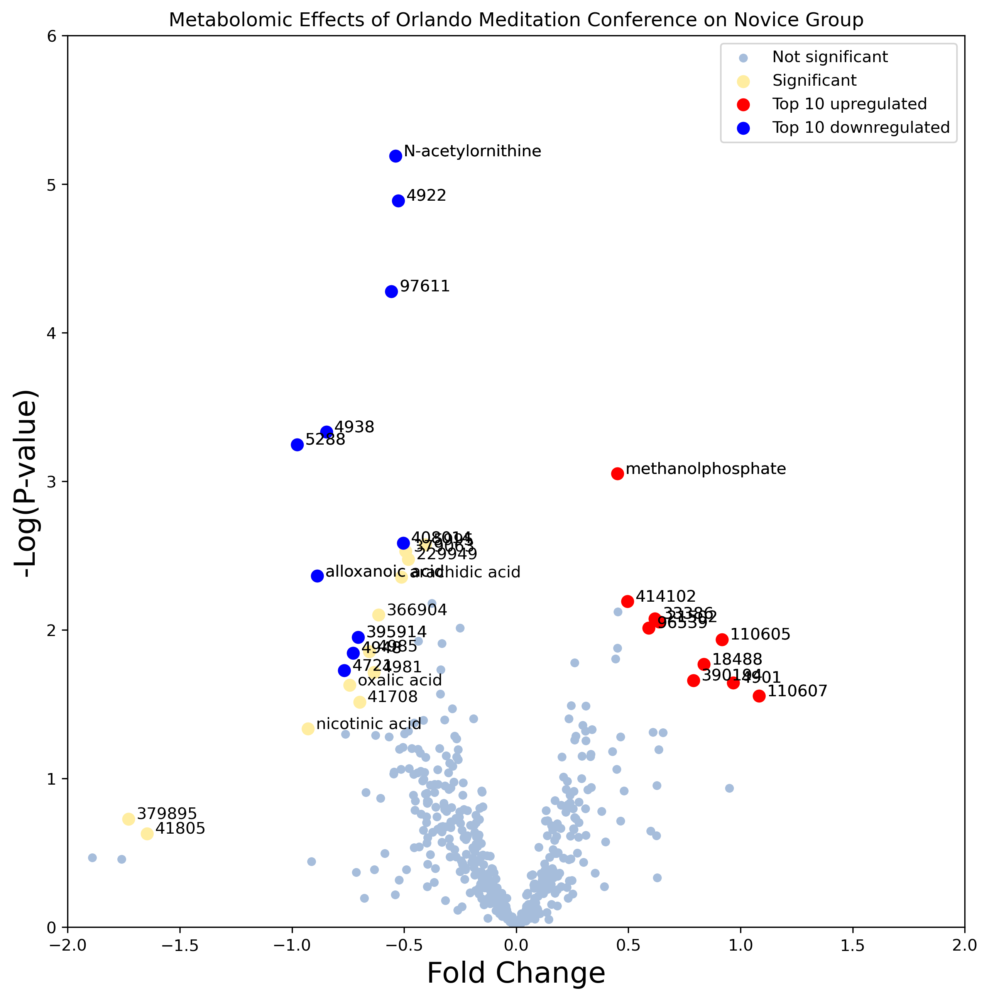

In [75]:
volcanotop10(df,significantdf,top10df,low10df,'Log2(Fold Change)','-Log(P-value)', 'Volcano_Plot_nooutlier.pdf')

## Expert Pre vs. Post

In [76]:
df

,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
0,xylulose,1290,2112,1046,926,1106,890,1088,1050,1259,1403,1166,788,1138,1612,651,894,1398,569,1283,791,1343,1166,1388,1344,975,1236,1120,1235,1241,1584,1333,1613,1429,1266,1333,767,1292,862,1519,1029,1603,1594,1059,1629,933,1328,1077,1735,1546,1649,1735,1103,1243,1593,1242,1189,1247,1200,1245,1696,1227,1606,855,814,1597,1873,1634,935,1211,758,1339,1234,1274,2189,994,827,1569,867,1139,1279,1172,1265,1594,1155,846,1441,1508,932,0.063614,1143.2500,1368.5000,0.835404,-0.259455,1.196449,-0.310424
1,xylose,3233,3726,2823,4138,4853,3804,3525,5340,2203,6668,6648,3677,4254,5547,1964,3734,3351,7070,3607,4081,3537,4614,74549,56804,3843,3688,2787,4690,2711,4243,8212,3971,13290,4417,14185,2965,4139,4672,2441,2224,4044,3822,5143,4648,3116,3817,3924,2858,3150,6454,5482,2592,4503,3519,25669,8728,4826,2810,2505,3187,15581,4073,9238,4438,68284,4205,3122,3019,5064,3234,7020,3127,5386,19342,2417,3237,3927,2168,6658,3036,8104,6342,8282,6168,6979,6307,8299,7817,0.377610,4085.5000,5373.6250,0.760288,-0.395383,0.422957,-0.167230
2,xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109,0.120750,1680.2500,1871.0000,0.898049,-0.155134,0.918113,-0.142430
3,valine,276131,288187,445771,747718,421332,388093,687899,219039,231204,482086,502335,373219,516675,260544,601783,717152,582775,617201,687413,281399,570384,482853,251066,467891,281536,549454,464481,519592,433613,517068,515781,466590,433615,679086,390731,750879,320589,568872,539901,253772,443244,352146,496728,636087,631247,407010,617442,430014,301897,294743,375008,457489,505554,521507,382317,670555,301978,552285,543101,254292,475512,292035,205897,608802,366284,541470,307233,624033,134242,551916,520175,426369,217877,371425,546934,563298,418838,573109,426019,230610,354517,529537,337474,543227,541503,534820,304721,524319,0.791969,449555.9375,463483.1875,0.969951,-0.044016,0.101292,-0.004459
4,uric acid,114534,160807,55772,93506,61041,91720,67616,85281,43811,41397,113637,109697,40950,73902,57891,79101,123241,87044,59621,84710,149080,108049,103065,54081,77094,61132,72424,61649,65041,117765,98307,114793,110162,60139,41167,44967,71313,121430,49769,34736,98775,97389,75811,88457,96628,106125,117744,115433,46339,76542,175980,111604,71518,73929,79051,80795,149845,86200,132827,102806,119280,146239,86742,43448,79353,80526,73330,107980,111104,75065,89598,88540,152591,97430,45625,62143,73319,190247,97548,64119,78695,64839,88082,79491,70733,74259,59054,72656,0.199423,78533.062

In [77]:
Grp1 = ['exp_pre', 'exp_pre.1', 'exp_pre.2', 'exp_pre.3', 'exp_pre.4', 'exp_pre.5', 'exp_pre.6', 'exp_pre.7', 'exp_pre.8', 'exp_pre.9', 'exp_pre.10', 'exp_pre.11', 'exp_pre.12', 'exp_pre.13', 'exp_pre.14']
Grp2 = ['exp_post', 'exp_post.1', 'exp_post.2', 'exp_post.3', 'exp_post.4', 'exp_post.5', 'exp_post.6', 'exp_post.7', 'exp_post.8', 'exp_post.9', 'exp_post.10', 'exp_post.11', 'exp_post.12', 'exp_post.13', 'exp_post.14']

Grp1_df = df[Grp1]
Grp2_df = df[Grp2]

Grp1_df.describe()

,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,exp_pre.14
count,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02,4.870000e+02
mean,2.514342e+04,2.619767e+04,2.500218e+04,2.523804e+04,3.093394e+04,2.379051e+04,2.743968e+04,2.692344e+04,2.346649e+04,2.596429e+04,2.746087e+04,2.690558e+04,2.542324e+04,2.544053e+04,2.532233e+04
std,1.220067e+05,1.315510e+05,1.173265e+05,1.189441e+05,1.687704e+05,1.098208e+05,1.365511e+05,1.317786e+05,1.136662e+05,1.388665e+05,1.304969e+05,1.355511e+05,1.132191e+05,1.220591e+05,1.502028e+05
min,1.610000e+02,1.870000e+02,5.600000e+01,1.950000e+02,1.370000e+02,1.080000e+02,2.280000e+02,1.070000e+02,1.550000e+02,1.990000e+02,1.630000e+02,1.930000e+02,9.500000e+01,2.020000e+02,8.000000e+01
25%,9.680000e+02,8.665000e+02,1.004500e+03,1.071500e+03,9.935000e+02,8.395000e+02,1.241500e+03,1.358000e+03,6.100000e+02,1.078000e+03,1.217000e+03,9.670000e+02,1.097500e+03,1.165500e+03,8.235000e+02
50%,2.378000e+03,2.056000e+03,2.286000e+03,2.425000e+03,2.259000e+03,2.070000e+03,3.056000e+03,3.091000e+03,1.578000e+03,2.524000e+03,2.864000e+03,2.280000e+03,2.637000e+03,2.523000e+03,1.942000e+03
75%,6.495000e+03,7.444000e+03,7.528500e+03,7.685500e+03,7.734000e+03,6.359500e+03,9.042000e+03,1.119250e+04,5.163500e+03,8.443500e+03,8.936000e+03,7.752000e+03,7.559500e+03,7.700500e+03,6.352500e+03
max,1.547476e+06,1.937221e+06,1.510505e+06,1.517660e+06,2.114056e+06,1.316893e+06,2.281098e+06,2.045441e+06,1.474993e+06,1.887304e+06,1.757769e+06,1.951753e+06,1.483141e+06,1.621467e+06,2.683290e+06


In [78]:
Grp2Grp1 = TwoCategoryMaster(df, Grp2_df, Grp1_df,"Grp2","Grp1")
Grp2Grp1

,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
0,xylulose,1290,2112,1046,926,1106,890,1088,1050,1259,1403,1166,788,1138,1612,651,894,1398,569,1283,791,1343,1166,1388,1344,975,1236,1120,1235,1241,1584,1333,1613,1429,1266,1333,767,1292,862,1519,1029,1603,1594,1059,1629,933,1328,1077,1735,1546,1649,1735,1103,1243,1593,1242,1189,1247,1200,1245,1696,1227,1606,855,814,1597,1873,1634,935,1211,758,1339,1234,1274,2189,994,827,1569,867,1139,1279,1172,1265,1594,1155,846,1441,1508,932,0.213304,1154.400000,1288.200000,0.896134,-0.158213,0.671001,-0.106161
1,xylose,3233,3726,2823,4138,4853,3804,3525,5340,2203,6668,6648,3677,4254,5547,1964,3734,3351,7070,3607,4081,3537,4614,74549,56804,3843,3688,2787,4690,2711,4243,8212,3971,13290,4417,14185,2965,4139,4672,2441,2224,4044,3822,5143,4648,3116,3817,3924,2858,3150,6454,5482,2592,4503,3519,25669,8728,4826,2810,2505,3187,15581,4073,9238,4438,68284,4205,3122,3019,5064,3234,7020,3127,5386,19342,2417,3237,3927,2168,6658,3036,8104,6342,8282,6168,6979,6307,8299,7817,0.631014,12883.400000,9433.133333,1.365760,0.449704,0.199961,0.089923
2,xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109,0.049637,1856.866667,2228.600000,0.833199,-0.263267,1.304193,-0.343352
3,valine,276131,288187,445771,747718,421332,388093,687899,219039,231204,482086,502335,373219,516675,260544,601783,717152,582775,617201,687413,281399,570384,482853,251066,467891,281536,549454,464481,519592,433613,517068,515781,466590,433615,679086,390731,750879,320589,568872,539901,253772,443244,352146,496728,636087,631247,407010,617442,430014,301897,294743,375008,457489,505554,521507,382317,670555,301978,552285,543101,254292,475512,292035,205897,608802,366284,541470,307233,624033,134242,551916,520175,426369,217877,371425,546934,563298,418838,573109,426019,230610,354517,529537,337474,543227,541503,534820,304721,524319,0.319252,486502.733333,428310.200000,1.135865,0.183792,0.495867,0.091136
4,uric acid,114534,160807,55772,93506,61041,91720,67616,85281,43811,41397,113637,109697,40950,73902,57891,79101,123241,87044,59621,84710,149080,108049,103065,54081,77094,61132,72424,61649,65041,117765,98307,114793,110162,60139,41167,44967,71313,121430,49769,34736,98775,97389,75811,88457,96628,106125,117744,115433,46339,76542,175980,111604,71518,73929,79051,80795,149845,86200,132827,102806,119280,146239,86742,43448,79353,80526,73330,107980,111104,75065,89598,88540,152591,97430,45625,62143,73319,190247,97548,64119,78695,64839,88082,79491,70733,74259,59054,72656,0.199

In [79]:
top10 = df['Grp2/Grp1 pi score'].nlargest(10)
low10 = df['Grp2/Grp1 pi score'].nsmallest(10)

top10df = df[df['Grp2/Grp1 pi score'].isin(top10)]
low10df = df[df['Grp2/Grp1 pi score'].isin(low10)]

In [80]:
#Subset out the significant proteins to a new dataframe
expert_sign= df[(abs(df['Grp2/Grp1 pi score']) > (1))]
expert_sign

,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
16,tartaric acid,291,1414,937,157,224,569,384,126,349,157,294,1397,312,543,196,348,1084,356,213,109,174,494,179,756,335,187,250,780,339,233,1047,1457,825,447,152,184,181,2211,552,128,21061,1429,1213,209,243,596,344,200,469,320,633,136,195,186,511,178,3344,208,195,222,2192,513,500,243,222,338,240,182,1005,217,402,217,1554,287,23614,180,185,246,713,373,1011,917,1056,890,758,926,606,941,0.256920,383.733333,2213.066667,0.173394,-2.527871,0.590203,-1.491956
23,salicylic acid,727,1195,1189,509,853,672,4803,649,1347,3825,888,2669,1436,987,2005,403,27158,1643,716,1005,1000,1107,598,1116,548,737,385,625,1310,3171,593,129783,1576,742,507,444,432,967,1145,869,425,1487,1183,688,712,1025,505,672,1271,7351,1844,1893,698,904,1015,531,83874,716,1133,532,583,1056,972,831,1072,1027,1116,828,1107044,993,901,1573,768,1241,440,346,968,630,728,643,19225,16439,16305,14546,16764,15040,17443,22203,0.309879,2590.533333,80117.000000,0.032334,-4.950787,0.508808,-2.519000
31,pipecolinic acid,814,757,3834,1012,510,880,2882,955,1298,1104,5207,425,4257,5995,1097,1691,1694,5466,7248,579,1278,1970,765,907,642,1303,3392,761,1261,1245,805,1308,1093,664,411,517,367,1827,1791,250,726,654,1917,1292,2095,765,5763,3222,744,616,894,606,5006,1060,648,545,677,856,1087,671,2607,515,554,2075,2077,651,765,953,466,1246,1679,974,324,498,362,869,584,2988,1013,491,1009,2602,568,2201,1470,2563,663,1440,0.088922,1957.866667,990.733333,1.976179,0.982714,1.050992,1.032824
40,parabanic acid,1755,2007,1318,1937,1224,643,738,1427,1416,1749,934,1628,1122,819,787,825,1088,1607,1313,1058,874,884,1066,1647,1334,1173,815,1069,1000,1400,4900,886,1083,1174,1132,1160,1984,989,745,693,3432,776,1036,2156,1488,2317,1042,772,2249,1631,1320,449,1107,2240,2260,2760,980,1237,2035,1337,1489,3558,2712,757,1509,2308,1199,1740,1745,1048,842,740,1254,1725,1045,1019,1528,985,2424,2144,2098,617,2625,1841,1671,788,3109,2169,0.008214,1125.666667,1760.733333,0.639317,-0.645397,2.085429,-1.345929
44,oxalic acid,53776,68411,1423,53938,34465,20074,1598,42117,12762,70860,30356,46267,48093,14142,20969,14282,1056,39381,31021,33106,25218,22343,33612,55313,34206,39978,13323,26943,12302,43487,152716,9868,41094,61888,63903,36888,66109,15538,6811,20266,111286,34936,45807,84138,25746,73240,18132,37812,107710,101193,27524,15484,42284,66730,84913,91016,33404,59635,54892,47960,49711,140212,98691,11986,36550,110419,40055,56719,59479,42335,15678,13790,55211,65198,42104,53524,77941,16098,81727,84874,40776,19088,78588,46664,47848,24459,75520,57536,0.003143,29732.466667,62188.866667,0.478100,-1.064617,2.502604,-2.664315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [81]:
#Export dataframe to csv with index
expert_sign.to_csv(r'./expert_significant_piscores.csv')

In [82]:
significantdf = expert_sign
significantdf = significantdf.reset_index()
significantdf

,index,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
0,16,tartaric acid,291,1414,937,157,224,569,384,126,349,157,294,1397,312,543,196,348,1084,356,213,109,174,494,179,756,335,187,250,780,339,233,1047,1457,825,447,152,184,181,2211,552,128,21061,1429,1213,209,243,596,344,200,469,320,633,136,195,186,511,178,3344,208,195,222,2192,513,500,243,222,338,240,182,1005,217,402,217,1554,287,23614,180,185,246,713,373,1011,917,1056,890,758,926,606,941,0.256920,383.733333,2213.066667,0.173394,-2.527871,0.590203,-1.491956
1,23,salicylic acid,727,1195,1189,509,853,672,4803,649,1347,3825,888,2669,1436,987,2005,403,27158,1643,716,1005,1000,1107,598,1116,548,737,385,625,1310,3171,593,129783,1576,742,507,444,432,967,1145,869,425,1487,1183,688,712,1025,505,672,1271,7351,1844,1893,698,904,1015,531,83874,716,1133,532,583,1056,972,831,1072,1027,1116,828,1107044,993,901,1573,768,1241,440,346,968,630,728,643,19225,16439,16305,14546,16764,15040,17443,22203,0.309879,2590.533333,80117.000000,0.032334,-4.950787,0.508808,-2.519000
2,31,pipecolinic acid,814,757,3834,1012,510,880,2882,955,1298,1104,5207,425,4257,5995,1097,1691,1694,5466,7248,579,1278,1970,765,907,642,1303,3392,761,1261,1245,805,1308,1093,664,411,517,367,1827,1791,250,726,654,1917,1292,2095,765,5763,3222,744,616,894,606,5006,1060,648,545,677,856,1087,671,2607,515,554,2075,2077,651,765,953,466,1246,1679,974,324,498,362,869,584,2988,1013,491,1009,2602,568,2201,1470,2563,663,1440,0.088922,1957.866667,990.733333,1.976179,0.982714,1.050992,1.032824
3,40,parabanic acid,1755,2007,1318,1937,1224,643,738,1427,1416,1749,934,1628,1122,819,787,825,1088,1607,1313,1058,874,884,1066,1647,1334,1173,815,1069,1000,1400,4900,886,1083,1174,1132,1160,1984,989,745,693,3432,776,1036,2156,1488,2317,1042,772,2249,1631,1320,449,1107,2240,2260,2760,980,1237,2035,1337,1489,3558,2712,757,1509,2308,1199,1740,1745,1048,842,740,1254,1725,1045,1019,1528,985,2424,2144,2098,617,2625,1841,1671,788,3109,2169,0.008214,1125.666667,1760.733333,0.639317,-0.645397,2.085429,-1.345929
4,44,oxalic acid,53776,68411,1423,53938,34465,20074,1598,42117,12762,70860,30356,46267,48093,14142,20969,14282,1056,39381,31021,33106,25218,22343,33612,55313,34206,39978,13323,26943,12302,43487,152716,9868,41094,61888,63903,36888,66109,15538,6811,20266,111286,34936,45807,84138,25746,73240,18132,37812,107710,101193,27524,15484,42284,66730,84913,91016,33404,59635,54892,47960,49711,140212,98691,11986,36550,110419,40055,56719,59479,42335,15678,13790,55211,65198,42104,53524,77941,16098,81727,84874,40776,19088,78588,46664,47848,24459,75520,57536,0.003143,29732.466667,62188.866667,0.478100,-1.064617,2.502604,-2.664315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [83]:
def volcanotop10(df, significantdf, top10high, top10low, foldchange, pvalue, savename):
    plt.figure(figsize=(10, 10))
    
    # Plotting non-significant points
    plt.scatter(df['%s' % (foldchange)], df['%s' % (pvalue)], c='#a6bddb', s=20, label='Not significant')
    
    # Plotting and annotating significant points
    plt.scatter(significantdf['%s' % (foldchange)], significantdf['%s' % (pvalue)], c='#ffeda0', s=50, label='Significant')
    for index, row in significantdf.iterrows():
        plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')

    #Plotting and annotating top 10 high points
    plt.scatter(top10high['%s' % (foldchange)], top10high['%s' % (pvalue)], c='r', s=50, label='Top 10 upregulated')
    for index, row in top10high.iterrows():
        plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')
    
    # Plotting and annotating top 10 low points
    plt.scatter(top10low['%s' % (foldchange)], top10low['%s' % (pvalue)], c='b', s=50, label='Top 10 downregulated')
    for index, row in top10low.iterrows():
        plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')
    

    plt.ylabel('-Log(P-value)', fontsize=18)
    plt.xlabel('Fold Change', fontsize=18)
    plt.xlim([-2, 2])  # For example, to set x-axis limits 
    plt.ylim([0, 6])  # For example, to set y-axis limits
    plt.title('Metabolomic Effects of Orlando Meditation Conference on Expert Group')
    plt.legend(scatterpoints=1)
    plt.savefig('%s' % (savename))

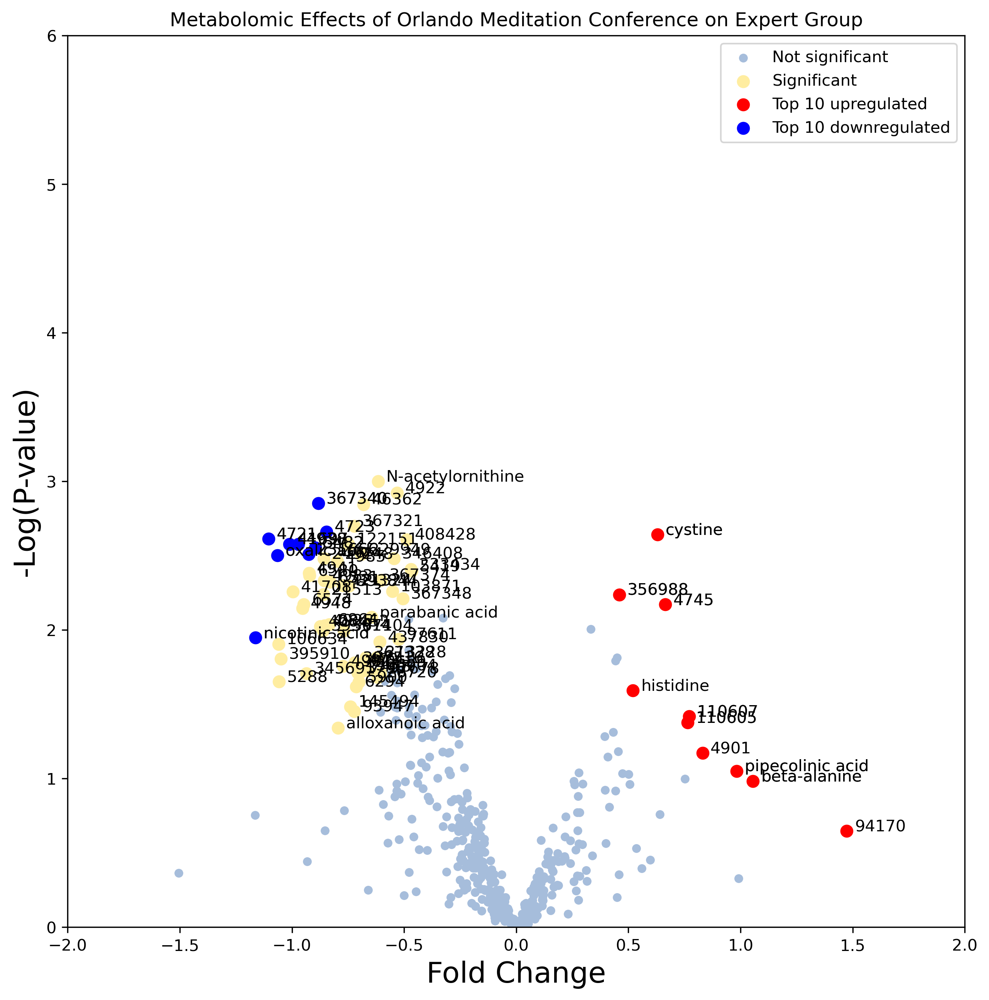

In [84]:
volcanotop10(df,significantdf,top10df,low10df,'Log2(Fold Change)','-Log(P-value)', 'Volcano_Plot_nooutlier.pdf')

## Group D Pre vs. Post

In [85]:
df

,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
0,xylulose,1290,2112,1046,926,1106,890,1088,1050,1259,1403,1166,788,1138,1612,651,894,1398,569,1283,791,1343,1166,1388,1344,975,1236,1120,1235,1241,1584,1333,1613,1429,1266,1333,767,1292,862,1519,1029,1603,1594,1059,1629,933,1328,1077,1735,1546,1649,1735,1103,1243,1593,1242,1189,1247,1200,1245,1696,1227,1606,855,814,1597,1873,1634,935,1211,758,1339,1234,1274,2189,994,827,1569,867,1139,1279,1172,1265,1594,1155,846,1441,1508,932,0.213304,1154.400000,1288.200000,0.896134,-0.158213,0.671001,-0.106161
1,xylose,3233,3726,2823,4138,4853,3804,3525,5340,2203,6668,6648,3677,4254,5547,1964,3734,3351,7070,3607,4081,3537,4614,74549,56804,3843,3688,2787,4690,2711,4243,8212,3971,13290,4417,14185,2965,4139,4672,2441,2224,4044,3822,5143,4648,3116,3817,3924,2858,3150,6454,5482,2592,4503,3519,25669,8728,4826,2810,2505,3187,15581,4073,9238,4438,68284,4205,3122,3019,5064,3234,7020,3127,5386,19342,2417,3237,3927,2168,6658,3036,8104,6342,8282,6168,6979,6307,8299,7817,0.631014,12883.400000,9433.133333,1.365760,0.449704,0.199961,0.089923
2,xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109,0.049637,1856.866667,2228.600000,0.833199,-0.263267,1.304193,-0.343352
3,valine,276131,288187,445771,747718,421332,388093,687899,219039,231204,482086,502335,373219,516675,260544,601783,717152,582775,617201,687413,281399,570384,482853,251066,467891,281536,549454,464481,519592,433613,517068,515781,466590,433615,679086,390731,750879,320589,568872,539901,253772,443244,352146,496728,636087,631247,407010,617442,430014,301897,294743,375008,457489,505554,521507,382317,670555,301978,552285,543101,254292,475512,292035,205897,608802,366284,541470,307233,624033,134242,551916,520175,426369,217877,371425,546934,563298,418838,573109,426019,230610,354517,529537,337474,543227,541503,534820,304721,524319,0.319252,486502.733333,428310.200000,1.135865,0.183792,0.495867,0.091136
4,uric acid,114534,160807,55772,93506,61041,91720,67616,85281,43811,41397,113637,109697,40950,73902,57891,79101,123241,87044,59621,84710,149080,108049,103065,54081,77094,61132,72424,61649,65041,117765,98307,114793,110162,60139,41167,44967,71313,121430,49769,34736,98775,97389,75811,88457,96628,106125,117744,115433,46339,76542,175980,111604,71518,73929,79051,80795,149845,86200,132827,102806,119280,146239,86742,43448,79353,80526,73330,107980,111104,75065,89598,88540,152591,97430,45625,62143,73319,190247,97548,64119,78695,64839,88082,79491,70733,74259,59054,72656,0.199

In [87]:
Grp1 = ['groupd_pre', 'groupd_pre.1', 'groupd_pre.2']
Grp2 = ['groupd_post', 'groupd_post.1']

Grp1_df = df[Grp1]
Grp2_df = df[Grp2]

Grp1_df.describe()

,groupd_pre,groupd_pre.1,groupd_pre.2
count,4.870000e+02,4.870000e+02,4.870000e+02
mean,2.833125e+04,2.400809e+04,2.794467e+04
std,1.365823e+05,1.154683e+05,1.209436e+05
min,2.070000e+02,1.010000e+02,2.290000e+02
25%,1.132000e+03,6.925000e+02,1.178500e+03
50%,2.580000e+03,1.673000e+03,2.758000e+03
75%,8.824500e+03,5.230500e+03,9.923000e+03
max,2.067542e+06,1.457266e+06,1.697183e+06


In [88]:
Grp2Grp1 = TwoCategoryMaster(df, Grp2_df, Grp1_df,"Grp2","Grp1")
Grp2Grp1

,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
0,xylulose,1290,2112,1046,926,1106,890,1088,1050,1259,1403,1166,788,1138,1612,651,894,1398,569,1283,791,1343,1166,1388,1344,975,1236,1120,1235,1241,1584,1333,1613,1429,1266,1333,767,1292,862,1519,1029,1603,1594,1059,1629,933,1328,1077,1735,1546,1649,1735,1103,1243,1593,1242,1189,1247,1200,1245,1696,1227,1606,855,814,1597,1873,1634,935,1211,758,1339,1234,1274,2189,994,827,1569,867,1139,1279,1172,1265,1594,1155,846,1441,1508,932,0.515987,1064.0,1398.333333,0.760906,-0.394210,0.287361,-0.113281
1,xylose,3233,3726,2823,4138,4853,3804,3525,5340,2203,6668,6648,3677,4254,5547,1964,3734,3351,7070,3607,4081,3537,4614,74549,56804,3843,3688,2787,4690,2711,4243,8212,3971,13290,4417,14185,2965,4139,4672,2441,2224,4044,3822,5143,4648,3116,3817,3924,2858,3150,6454,5482,2592,4503,3519,25669,8728,4826,2810,2505,3187,15581,4073,9238,4438,68284,4205,3122,3019,5064,3234,7020,3127,5386,19342,2417,3237,3927,2168,6658,3036,8104,6342,8282,6168,6979,6307,8299,7817,0.445585,4544.5,9389.333333,0.484007,-1.046901,0.351069,-0.367535
2,xylitol,2204,1830,1558,1351,1372,2111,1197,1761,1663,2343,1225,1611,2035,1872,1453,1544,1299,2220,1510,1652,1496,1877,3334,2593,1794,1869,1204,1857,1571,60075,2899,1777,2580,1437,2033,1298,1511,12748,1523,1348,2035,2006,1371,1764,1516,2314,1402,1916,2257,2100,2150,1748,1555,1918,2266,1966,1629,2482,1837,2141,2439,1818,2826,2146,2450,2537,3264,1892,2230,1288,1803,2192,2937,1938,1772,1618,2174,1872,2055,1634,2851,2349,2725,2390,2550,2138,2683,3109,0.530523,7092.5,1955.000000,3.627877,1.859126,0.275296,0.511810
3,valine,276131,288187,445771,747718,421332,388093,687899,219039,231204,482086,502335,373219,516675,260544,601783,717152,582775,617201,687413,281399,570384,482853,251066,467891,281536,549454,464481,519592,433613,517068,515781,466590,433615,679086,390731,750879,320589,568872,539901,253772,443244,352146,496728,636087,631247,407010,617442,430014,301897,294743,375008,457489,505554,521507,382317,670555,301978,552285,543101,254292,475512,292035,205897,608802,366284,541470,307233,624033,134242,551916,520175,426369,217877,371425,546934,563298,418838,573109,426019,230610,354517,529537,337474,543227,541503,534820,304721,524319,0.139230,623979.0,456851.000000,1.365826,0.449774,0.856267,0.385127
4,uric acid,114534,160807,55772,93506,61041,91720,67616,85281,43811,41397,113637,109697,40950,73902,57891,79101,123241,87044,59621,84710,149080,108049,103065,54081,77094,61132,72424,61649,65041,117765,98307,114793,110162,60139,41167,44967,71313,121430,49769,34736,98775,97389,75811,88457,96628,106125,117744,115433,46339,76542,175980,111604,71518,73929,79051,80795,149845,86200,132827,102806,119280,146239,86742,43448,79353,80526,73330,107980,111104,75065,89598,88540,152591,97430,45625,62143,73319,190247,97548,64119,78695,64839,88082,79491,70733,74259,59054,72656,0.457790,90784.5,128408.33

In [89]:
top10 = df['Grp2/Grp1 pi score'].nlargest(10)
low10 = df['Grp2/Grp1 pi score'].nsmallest(10)

top10df = df[df['Grp2/Grp1 pi score'].isin(top10)]
low10df = df[df['Grp2/Grp1 pi score'].isin(low10)]

In [90]:
#Subset out the significant proteins to a new dataframe
groupd_sign= df[(abs(df['Grp2/Grp1 pi score']) > (1))]
groupd_sign

,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
131,3-hydroxybutyric acid,26889,14388,21461,20618,64034,35763,65076,127819,43134,160766,19701,31520,10243,19744,167911,42737,20987,12428,18791,333737,103761,86200,21286,75845,665990,121283,157438,27178,35946,48165,23172,39729,17677,156395,219023,126295,30720,112624,91979,280117,18508,15382,21721,18459,15037,101910,130619,163153,418754,26021,19794,17061,16923,21194,84717,23387,33038,49935,70635,132387,21875,11721,57561,23750,78315,207265,255776,72753,130888,20394,39598,16358,40059,25525,149017,168442,29684,33865,71545,524503,93691,73045,99140,77143,73369,74440,92119,73485,0.081912,134509.5,43645.000000,3.081899,1.623820,1.086650,1.764524
218,367348,450,450,251,346,351,233,306,538,229,431,278,301,373,198,289,206,172,454,267,186,325,272,316,447,362,276,366,247,323,361,742,277,364,126,254,300,267,199,376,242,562,268,292,441,370,337,413,184,492,502,287,190,317,357,495,378,327,211,425,481,401,611,464,226,642,570,421,258,580,401,295,247,438,499,355,288,362,217,366,359,313,242,375,206,466,449,532,540,0.124038,162.5,360.666667,0.450555,-1.150226,0.906444,-1.042616
254,329435,630,560,414,613,793,515,684,638,654,378,621,623,341,517,614,903,274,402,447,1214,823,839,1013,788,1107,439,1136,647,523,495,244,622,570,1294,1336,974,2040,1122,381,337,851,518,594,323,1026,856,604,603,715,654,778,695,659,452,840,1026,658,335,667,1020,585,970,812,810,581,1087,773,646,652,672,293,510,1169,457,887,680,453,594,749,847,857,1027,648,545,882,1088,684,741,0.020417,1208.0,600.000000,2.013333,1.009586,1.690016,1.706217
362,31559,1347,829,1591,615,1161,813,452,754,799,769,1248,613,4935,6410,11110,456,1366,986,1633,951,607,539,3535,11354,2034,570,695,519,9645,727,1391,822,2120,597,450,791,1070,2300,10600,613,1239,3314,534,5521,1518,10118,425,540,951,952,24120,345,4668,607,803,518,619,942,33218,1397,6496,2978,715,870,3171,562,644,1133,547,608,3461,1698,2261,1863,2015,500,557,431,63499,1652,3287,2625,3452,2908,4066,2812,3257,2789,0.428376,1448.5,21931.000000,0.066048,-3.920340,0.368175,-1.443372
427,4986,12055,9341,9499,4300,8905,6196,4012,6862,12781,6463,8846,5673,6358,11096,5214,8469,9460,2568,6310,7418,8008,4213,8261,6313,9200,5602,6459,6380,5496,4972,6963,7561,3465,5821,7591,6177,3823,5677,9415,9994,10556,11799,7291,5116,4997,6745,7456,3848,9098,7911,7769,5355,10168,6293,5239,6422,10226,6237,7990,12476,5374,5136,3545,3403,7344,5537,6771,10059,3394,7449,6005,4806,8893,7387,6683,8594,4629,7188,7478,8180,8835,6682,7137,7993,6633,7253,6490,41786,0.000859,5749.0,7351.000000,0.782070,-0.354629,3.065849,-1.087241


In [91]:
#Export dataframe to csv with index
groupd_sign.to_csv(r'./groupd_significant_piscores.csv')

In [92]:
significantdf = groupd_sign
significantdf = significantdf.reset_index()
significantdf

,index,metabolite,novice_post,novice_post.1,novice_post.2,novice_post.3,novice_post.4,novice_post.5,novice_post.6,novice_post.7,novice_post.8,novice_post.9,novice_post.10,novice_post.11,novice_post.12,novice_post.13,novice_post.14,exp_post,exp_post.1,exp_post.2,exp_post.3,exp_post.4,exp_post.5,exp_post.6,exp_post.7,exp_post.8,exp_post.9,exp_post.10,exp_post.11,exp_post.12,exp_post.13,control_post,control_post.1,control_post.2,control_post.3,groupd_post,exp_post.14,novice_post.15,control_post.4,groupd_post.1,control_post.5,exp_post.15,novice_pre,novice_pre.1,novice_pre.2,novice_pre.3,novice_pre.4,novice_pre.5,novice_pre.6,novice_pre.7,novice_pre.8,novice_pre.9,novice_pre.10,novice_pre.11,novice_pre.12,novice_pre.13,novice_pre.14,exp_pre,exp_pre.1,exp_pre.2,exp_pre.3,exp_pre.4,exp_pre.5,exp_pre.6,exp_pre.7,exp_pre.8,exp_pre.9,exp_pre.10,exp_pre.11,exp_pre.12,exp_pre.13,control_pre,control_pre.1,control_pre.2,control_pre.3,groupd_pre,exp_pre.14,novice_pre.15,control_pre.4,groupd_pre.1,groupd_pre.2,control_pre.5,pool,pool.1,pool.2,pool.3,pool.4,pool.5,pool.6,pool.7,ttest_pvalue,Grp2 Mean,Grp1 Mean,Fold Change(Grp2/Grp1),Log2(Fold Change),-Log(P-value),Grp2/Grp1 pi score
0,131,3-hydroxybutyric acid,26889,14388,21461,20618,64034,35763,65076,127819,43134,160766,19701,31520,10243,19744,167911,42737,20987,12428,18791,333737,103761,86200,21286,75845,665990,121283,157438,27178,35946,48165,23172,39729,17677,156395,219023,126295,30720,112624,91979,280117,18508,15382,21721,18459,15037,101910,130619,163153,418754,26021,19794,17061,16923,21194,84717,23387,33038,49935,70635,132387,21875,11721,57561,23750,78315,207265,255776,72753,130888,20394,39598,16358,40059,25525,149017,168442,29684,33865,71545,524503,93691,73045,99140,77143,73369,74440,92119,73485,0.081912,134509.5,43645.000000,3.081899,1.623820,1.086650,1.764524
1,218,367348,450,450,251,346,351,233,306,538,229,431,278,301,373,198,289,206,172,454,267,186,325,272,316,447,362,276,366,247,323,361,742,277,364,126,254,300,267,199,376,242,562,268,292,441,370,337,413,184,492,502,287,190,317,357,495,378,327,211,425,481,401,611,464,226,642,570,421,258,580,401,295,247,438,499,355,288,362,217,366,359,313,242,375,206,466,449,532,540,0.124038,162.5,360.666667,0.450555,-1.150226,0.906444,-1.042616
2,254,329435,630,560,414,613,793,515,684,638,654,378,621,623,341,517,614,903,274,402,447,1214,823,839,1013,788,1107,439,1136,647,523,495,244,622,570,1294,1336,974,2040,1122,381,337,851,518,594,323,1026,856,604,603,715,654,778,695,659,452,840,1026,658,335,667,1020,585,970,812,810,581,1087,773,646,652,672,293,510,1169,457,887,680,453,594,749,847,857,1027,648,545,882,1088,684,741,0.020417,1208.0,600.000000,2.013333,1.009586,1.690016,1.706217
3,362,31559,1347,829,1591,615,1161,813,452,754,799,769,1248,613,4935,6410,11110,456,1366,986,1633,951,607,539,3535,11354,2034,570,695,519,9645,727,1391,822,2120,597,450,791,1070,2300,10600,613,1239,3314,534,5521,1518,10118,425,540,951,952,24120,345,4668,607,803,518,619,942,33218,1397,6496,2978,715,870,3171,562,644,1133,547,608,3461,1698,2261,1863,2015,500,557,431,63499,1652,3287,2625,3452,2908,4066,2812,3257,2789,0.428376,1448.5,21931.000000,0.066048,-3.920340,0.368175,-1.443372
4,427,4986,12055,9341,9499,4300,8905,6196,4012,6862,12781,6463,8846,5673,6358,11096,5214,8469,9460,2568,6310,7418,8008,4213,8261,6313,9200,5602,6459,6380,5496,4972,6963,7561,3465,5821,7591,6177,3823,5677,9415,9994,10556,11799,7291,5116,4997,6745,7456,3848,9098,7911,7769,5355,10168,6293,5239,6422,10226,6237,7990,12476,5374,5136,3545,3403,7344,5537,6771,10059,3394,7449,6005,4806,8893,7387,6683,8594,4629,7188,7478,8180,8835,6682,7137,7993,6633,7253,6490,41786,0.000859,5749.0,7351.000000,0.782070,-0.354629,3.065849,-1.087241


In [103]:
def volcanotop10(df, significantdf, top10high, top10low, foldchange, pvalue, savename):
    plt.figure(figsize=(10, 10))
    
    # Plotting non-significant points
    plt.scatter(df['%s' % (foldchange)], df['%s' % (pvalue)], c='#a6bddb', s=20, label='Not significant')
    
    # Plotting and annotating significant points
    plt.scatter(significantdf['%s' % (foldchange)], significantdf['%s' % (pvalue)], c='#ffeda0', s=50, label='Significant')
    for index, row in significantdf.iterrows():
        plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')

    #Plotting and annotating top 10 high points
    plt.scatter(top10high['%s' % (foldchange)], top10high['%s' % (pvalue)], c='r', s=50, label='Top 10 upregulated')
    for index, row in top10high.iterrows():
        plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')
    
    # Plotting and annotating top 10 low points
    plt.scatter(top10low['%s' % (foldchange)], top10low['%s' % (pvalue)], c='b', s=50, label='Top 10 downregulated')
    for index, row in top10low.iterrows():
        plt.annotate(row['metabolite'], (row[foldchange], row[pvalue]), xytext=(5, 0), textcoords='offset points')
    

    plt.ylabel('-Log(P-value)', fontsize=18)
    plt.xlabel('Fold Change', fontsize=18)
    plt.xlim([-2, 2])  # For example, to set x-axis limits 
    plt.ylim([0, 6])  # For example, to set y-axis limits
    plt.title('Metabolomic Effects of Orlando Meditation Conference on Group D (3 indiv. pre and 2 indiv. post)')
    plt.legend(scatterpoints=1)
    plt.savefig('%s' % (savename))

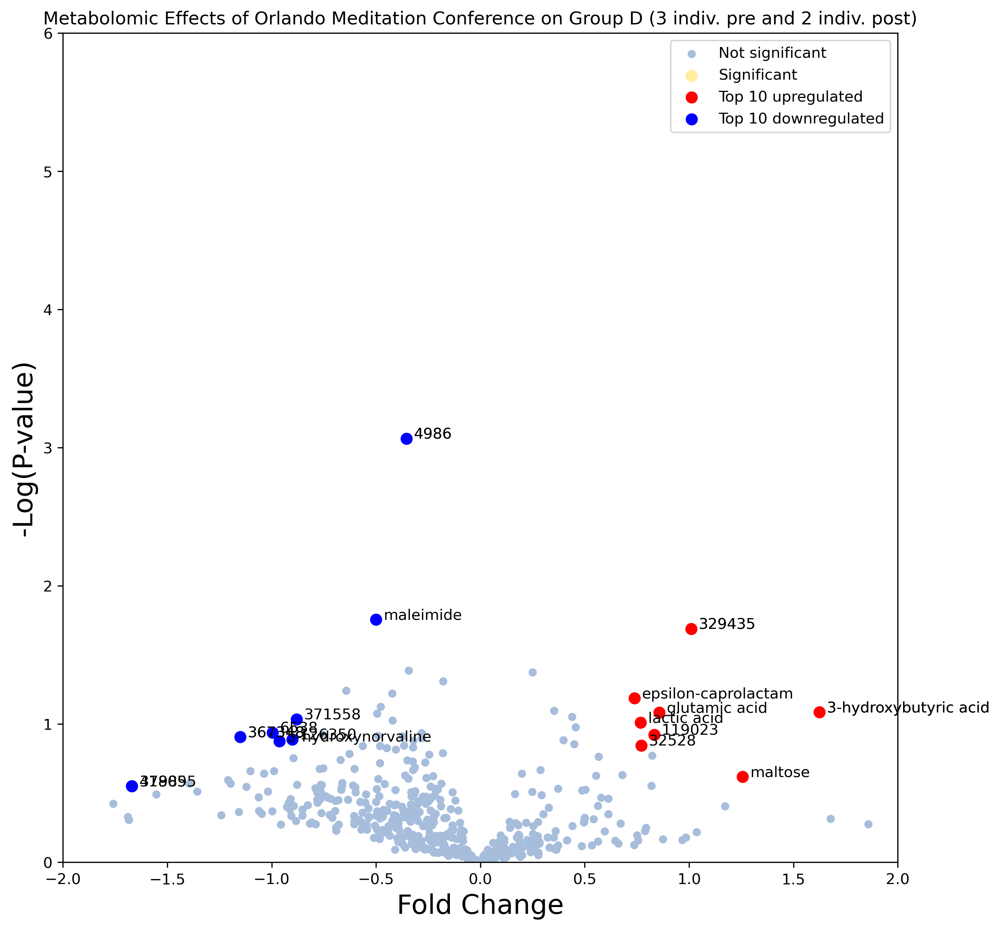

In [104]:
volcanotop10(df,significantdf,top10df,low10df,'Log2(Fold Change)','-Log(P-value)', 'Volcano_Plot_nooutlier.pdf')